In [1]:
#importar las librerias necesarias
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import folium   
import geopandas as gpd
from textwrap import wrap

# Indicadores de efectividad
---


Almacenar en un dataset el conjunto de indicadores que corresponden a efectividad por departamento, las columnas son:
* **Indicador**: nombre del indicador en efectividad
* **CodDepto**: codigo del departamento
* **Departamento**: nombre del departamento
* **Factor**: año del indicador
* **UnidadMedida**: unidad de medida del indicador 
* **Fecha**: fecha de la actualización del indicador
* **Numerador**: valor del numerador del indicador
* **Denominador**: valor del denominador del indicador
* **Valor**: valor del indicador

In [2]:
df_efectividad=pd.read_csv('data/IndicadoresIPS/efectividad.csv')#leer el archivo csv
df_efectividad.rename(columns={'Textbox2':'Valor',
                               'Fecha':'Periodo'},
                                 inplace=True)#renombrar las columnas

## Selección de indicadores:
Revisamos cuales son todas los indicadores de efectividad que se encuentran en el dataset de indicadores de efectividad, esto debido a que necesitamos el total para mediante el proceso manual descrito en el proyecto se seleccionen solo ciertos indicadores

```python

In [3]:
df_efectividad["Indicador"].unique()

array(['Proporción de niños y niñas menores de 18 meses, hijos de madre viviendo con Virus de la inmunodeficiencia Humana (VIH), con diagnóstico de Virus de la inmunodeficiencia Humana (VIH)',
       'Proporción de mujeres a las que se les realizó toma de serología en el momento del parto o aborto',
       'Proporción de personas con Hipertensión Arterial a quienes se les realiza medición de LDL',
       'Proporción de personas con Diabetes a quienes se les realizó toma de hemoglobina glicosilada en el último semestre',
       'Proporción de personas con Diabetes Mellitus a quienes se les realiza medición de LDL',
       'Proporción de personas con Hipertensión Arterial (HTA), estudiadas para Enfermedad Renal Crónica(ERC)',
       'Proporción de personas con Diabetes Mellitus, estudiadas para Enfermedad Renal Crónica(ERC)',
       'Proporción  de reingreso hospitalario por  Infección Respiratoria Aguda (IRA) en menores de 5 años',
       'Proporción de gestantes con consulta de control

Seleccionamos los indicadores que han superado el proceso de selección manual hasta el marco de finalidad de la investigación

```python

In [4]:

ind_Efectividad=['Proporción de niños y niñas menores de 18 meses, hijos de madre viviendo con Virus de la inmunodeficiencia Humana (VIH), con diagnóstico de Virus de la inmunodeficiencia Humana (VIH)',
       'Proporción de mujeres a las que se les realizó toma de serología en el momento del parto o aborto',
       'Proporción de personas con Hipertensión Arterial a quienes se les realiza medición de LDL',
       'Proporción de personas con Diabetes a quienes se les realizó toma de hemoglobina glicosilada en el último semestre',
       'Proporción de personas con Diabetes Mellitus a quienes se les realiza medición de LDL',
       'Proporción de personas con Hipertensión Arterial (HTA), estudiadas para Enfermedad Renal Crónica(ERC)',
       'Proporción de personas con Diabetes Mellitus, estudiadas para Enfermedad Renal Crónica(ERC)',
       'Proporción de gestantes con consulta de control prenatal de primera vez antes de las 12 semanas de gestación',
       'Proporción de gestantes con valoración por odontología',
       'Tasa de mortalidad perinatal',
       'Proporción  de recién nacidos con tamizaje para Hipotiroidismo',
       'Proporción de gestantes con asesoría pre-test para prueba de  Virus de la inmunodeficiencia Humana (VIH)',
       'Proporción de mujeres entre los 50 y 69 años con toma de mamografía en los últimos 2 años.',
       'Proporción de mujeres entre 25 y 69 años con toma de citología en el último año. ',
       'Tiempo promedio de espera para el inicio del tratamiento en cáncer de mama',
       'Tiempo promedio de espera entre el diagnóstico probable y el diagnóstico definitivo Leucemia Aguda Pediátrica (LAP) en menores de 18 años']
df_efectividad=df_efectividad[df_efectividad["Indicador"].isin(ind_Efectividad)]

### Tipos de datos

In [5]:
columnas=['Valor','Numerador','Denominador']
for c in columnas:
    df_efectividad[c]=df_efectividad[c].astype(float)

## Proporciones por departamentos

lorem ipsum

```python

In [6]:
indicadores_proporciones=['Proporción de niños y niñas menores de 18 meses, hijos de madre viviendo con Virus de la inmunodeficiencia Humana (VIH), con diagnóstico de Virus de la inmunodeficiencia Humana (VIH)',
       'Proporción de mujeres a las que se les realizó toma de serología en el momento del parto o aborto',
       'Proporción de personas con Hipertensión Arterial a quienes se les realiza medición de LDL',
       'Proporción de personas con Diabetes a quienes se les realizó toma de hemoglobina glicosilada en el último semestre',
       'Proporción de personas con Diabetes Mellitus a quienes se les realiza medición de LDL',
       'Proporción de personas con Hipertensión Arterial (HTA), estudiadas para Enfermedad Renal Crónica(ERC)',
       'Proporción de personas con Diabetes Mellitus, estudiadas para Enfermedad Renal Crónica(ERC)',
       'Proporción de gestantes con consulta de control prenatal de primera vez antes de las 12 semanas de gestación',
       'Proporción de gestantes con valoración por odontología',
       'Tasa de mortalidad perinatal',
       'Proporción  de recién nacidos con tamizaje para Hipotiroidismo',
       'Proporción de gestantes con asesoría pre-test para prueba de  Virus de la inmunodeficiencia Humana (VIH)',
       'Proporción de mujeres entre los 50 y 69 años con toma de mamografía en los últimos 2 años.',
       'Proporción de mujeres entre 25 y 69 años con toma de citología en el último año. ',
]#lista de los indicadores de proporciones en efectividad
df_proporciones_ef_dep=df_efectividad[df_efectividad["Indicador"].isin(indicadores_proporciones)]#seleccionar los registros que corresponden a los indicadores de proporciones
df_proporciones_ef_dep=df_proporciones_ef_dep[['Indicador','Departamento','Factor','Periodo','Numerador','Denominador']]# seleccionar las columnas de interés
df_proporciones_ef_dep=df_proporciones_ef_dep.groupby(['Indicador','Departamento','Factor','Periodo']).sum().reset_index()#agrupar por indicador, departamento y periodo
df_proporciones_ef_dep['Departamento']=df_proporciones_ef_dep['Departamento'].str.upper()#convertir a mayúsculas el nombre del departamento
df_proporciones_ef_dep.head()

,Indicador,Departamento,Factor,Periodo,Numerador,Denominador
0,Proporción de recién nacidos con tamizaje par...,AMAZONAS,100,2016-06,5.0,374.0
1,Proporción de recién nacidos con tamizaje par...,AMAZONAS,100,2016-12,16.0,363.0
2,Proporción de recién nacidos con tamizaje par...,AMAZONAS,100,2017-06,21.0,531.0
3,Proporción de recién nacidos con tamizaje par...,AMAZONAS,100,2017-12,24.0,472.0
4,Proporción de recién nacidos con tamizaje par...,AMAZONAS,100,2018-06,26.0,477.0


Debido a que por departamento se tienen diferentes periodicidades cuando el indicador fue calculado seselecciona el periodo en el cual se quiere mostrar la información en el mapa, para aquellos registoros que no se encuentren en el periodo seleccionado se les asigna un valor de nulo que se aprecia en el mapa con un color gris, también se selecciona un solo indicador para mostrar en el mapa

```python


In [7]:
proporcion_seleccionada=indicadores_proporciones[7]#seleccionar un indicador para realizar el mapa
df_mapa=df_proporciones_ef_dep[df_proporciones_ef_dep['Indicador']==proporcion_seleccionada]#seleccionar un indicador para realizar el mapa
periodos=df_mapa['Periodo'].unique()#obtener los periodos
periodo_seleccionado=periodos[6]#seleccionar un periodo para realizar el mapa
df_mapa=df_mapa[df_mapa['Periodo']==periodo_seleccionado]#seleccionar un periodo para realizar el mapa

Ahora si se calcula la proporción del indicador por departamento en el periodo seleccionado

In [8]:
df_mapa=df_mapa.groupby('Departamento').sum().reset_index()#agrupar por departamento y calcular el promedio de los indicadores
df_mapa['Valor Departamental(%)']=round((df_mapa['Numerador']/df_mapa['Denominador'])*100,3)#calcular el valor nacional
df_mapa.head()

/tmp/ipykernel_13837/350925881.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_mapa=df_mapa.groupby('Departamento').sum().reset_index()#agrupar por departamento y calcular el promedio de los indicadores


,Departamento,Factor,Numerador,Denominador,Valor Departamental(%)
0,AMAZONAS,100,125.0,475.0,26.316
1,ANTIOQUIA,100,24015.0,25973.0,92.461
2,ARAUCA,100,1075.0,1698.0,63.310
3,"ARCHIPIÉLAGO DE SAN ANDRÉS, PROVIDENCIA Y SANT...",100,55.0,323.0,17.028
4,ATLÁNTICO,100,8650.0,13869.0,62.369


In [9]:
data_json= gpd.read_file('./data/Colombia_departamentos_poblacion.geojson', driver = "GeoJSON")#leer el archivo geojson
data_json=data_json.join(df_mapa.set_index('Departamento'), on='DPTO_CNMBR', how='left')#unir el archivo geojson con el dataframe de los indicadores
map = folium.Map(location=[4.570868, -74.297333],zoom_start=6)#crear el mapa

cp=folium.Choropleth(#crear el mapa coroplético
    geo_data=data_json,
    data=df_mapa,
    columns=['Departamento', 'Valor Departamental(%)'],
    key_on='feature.properties.DPTO_CNMBR',
    legend_name='Valor Departamental(%)',
    fill_color='BuPu',
    fill_opacity=0.8
).add_to(map)

cp.geojson.add_child(folium.GeoJsonTooltip(fields=['DPTO_CNMBR','Valor Departamental(%)'], #agregar el tooltip
                                           aliases=['Departamento','Valor Departamental(%)']))

#Añadir el titulo al mapa
title = '\n'.join(wrap((proporcion_seleccionada + ' en ' + periodo_seleccionado),80))
title_html = """
            <div id='maplegend' class='maplegend' 
            style='position: absolute; z-index:9999; border:10px; background-color:rgba(200, 0, 255, 0.1);
             border-radius:6px; padding: 10px; font-size:15px; left: 15px; top: 700px;'>

            <div class='legend-title'><b>{}</b></div>
            </div>""".format(title)   
map.get_root().html.add_child(folium.Element(title_html))
map


In [10]:
indicador_proporciones=['Proporción de niños y niñas menores de 18 meses, hijos de madre viviendo con Virus de la inmunodeficiencia Humana (VIH), con diagnóstico de Virus de la inmunodeficiencia Humana (VIH)',
       'Proporción de mujeres a las que se les realizó toma de serología en el momento del parto o aborto',
       'Proporción de personas con Hipertensión Arterial a quienes se les realiza medición de LDL',
       'Proporción de personas con Diabetes a quienes se les realizó toma de hemoglobina glicosilada en el último semestre',
       'Proporción de personas con Diabetes Mellitus a quienes se les realiza medición de LDL',
       'Proporción de personas con Hipertensión Arterial (HTA), estudiadas para Enfermedad Renal Crónica(ERC)',
       'Proporción de personas con Diabetes Mellitus, estudiadas para Enfermedad Renal Crónica(ERC)',
       'Proporción de gestantes con consulta de control prenatal de primera vez antes de las 12 semanas de gestación',
       'Proporción de gestantes con valoración por odontología',
       'Tasa de mortalidad perinatal',
       'Proporción  de recién nacidos con tamizaje para Hipotiroidismo',
       'Proporción de gestantes con asesoría pre-test para prueba de  Virus de la inmunodeficiencia Humana (VIH)',
       'Proporción de mujeres entre los 50 y 69 años con toma de mamografía en los últimos 2 años.',
       'Proporción de mujeres entre 25 y 69 años con toma de citología en el último año. ']
df_proporciones_ef=df_efectividad[df_efectividad["Indicador"].isin(indicador_proporciones)]
df_proporciones_ef.head()

,Indicador,CodDepto,Departamento,Factor,UnidadMedida,Periodo,Numerador,Denominador,Valor
0,Proporción de niños y niñas menores de 18 mese...,91,Amazonas,100,Porcentaje,2018-12,0.0,1.0,0.00
1,Proporción de niños y niñas menores de 18 mese...,91,Amazonas,100,Porcentaje,2019-12,0.0,1.0,0.00
2,Proporción de niños y niñas menores de 18 mese...,91,Amazonas,100,Porcentaje,2020-12,0.0,2.0,0.00
3,Proporción de mujeres a las que se les realizó...,91,Amazonas,100,Porcentaje,2015-12,0.0,1.0,0.00
4,Proporción de mujeres a las que se les realizó...,91,Amazonas,100,Porcentaje,2016-12,33.0,38.0,86.84


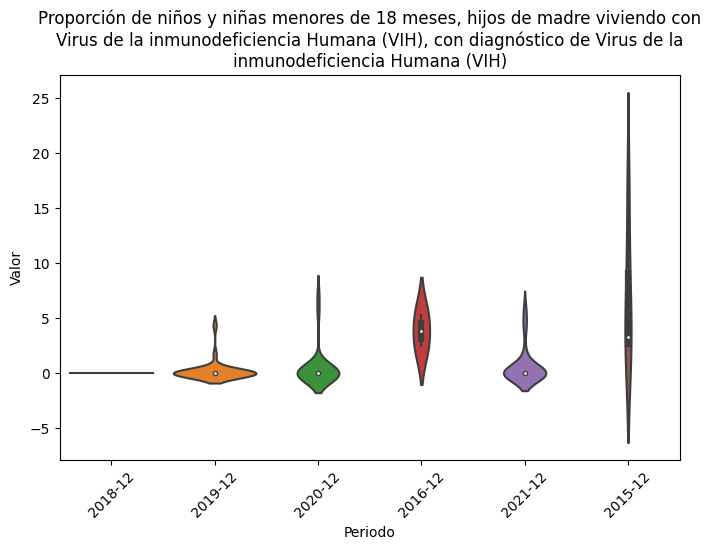

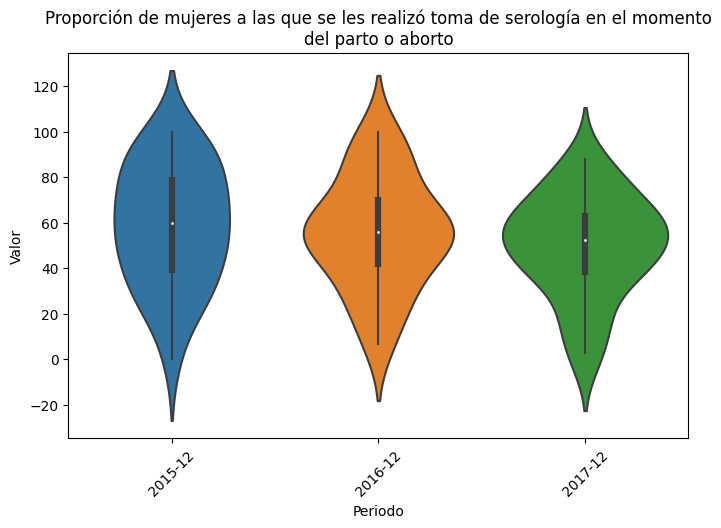

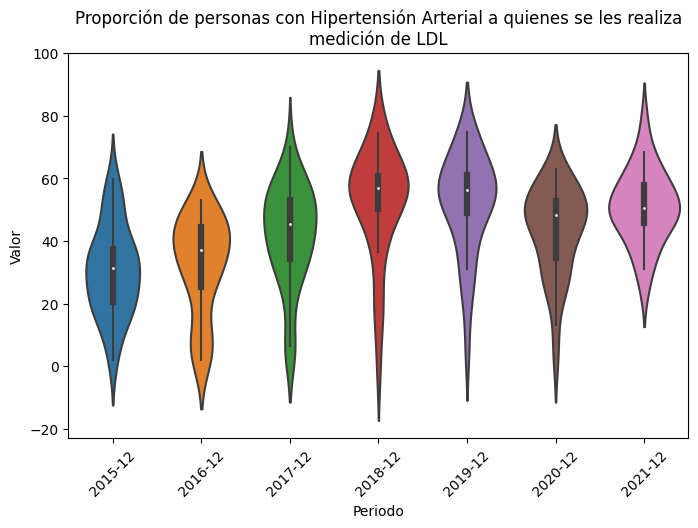

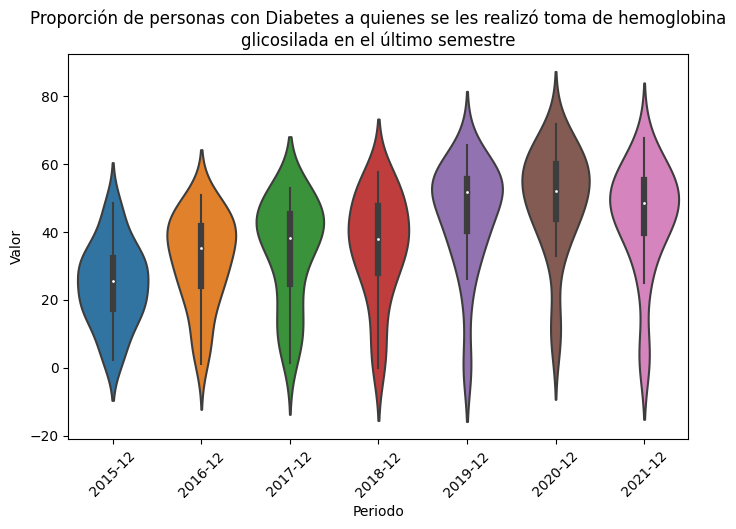

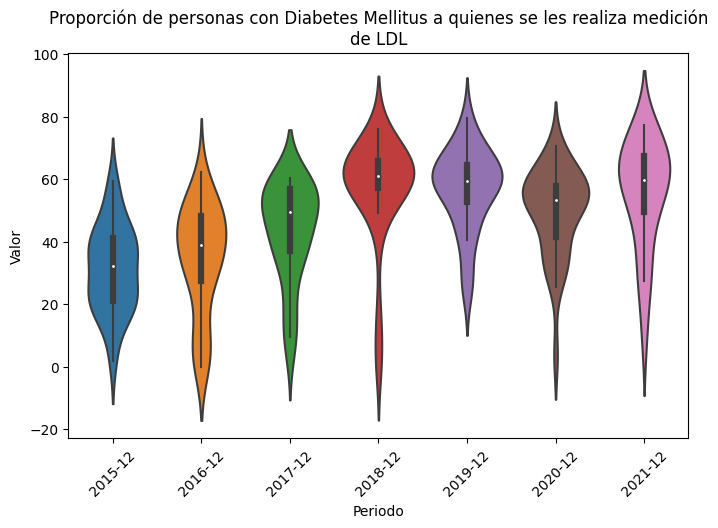

...

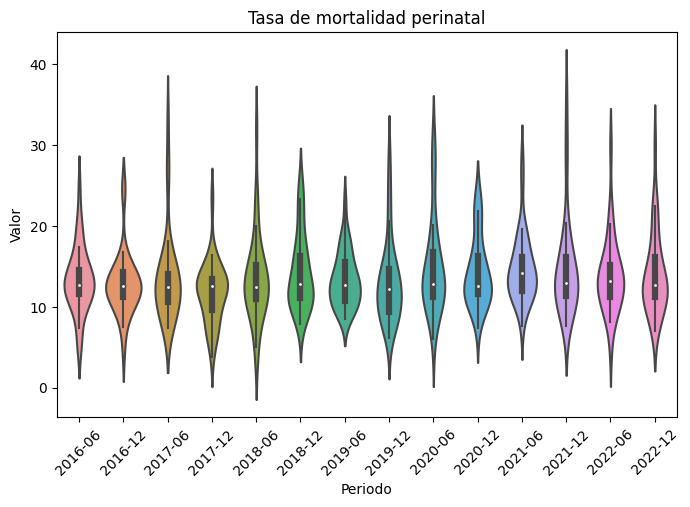

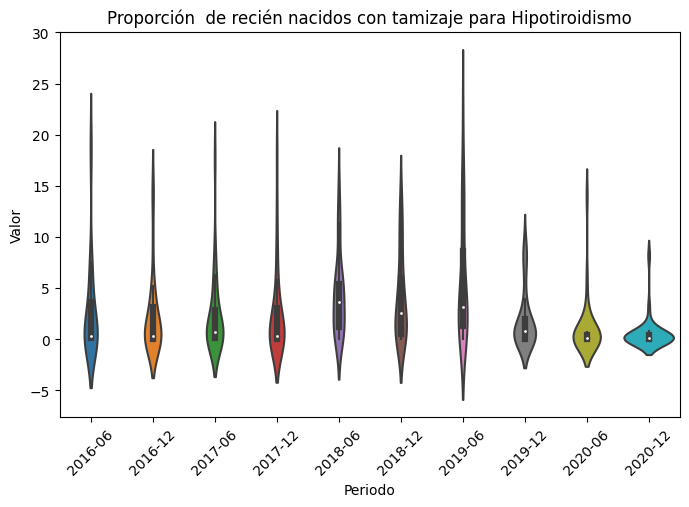

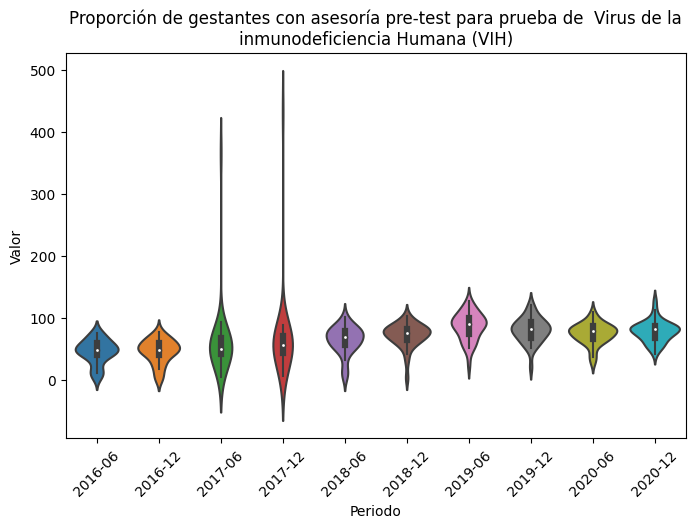

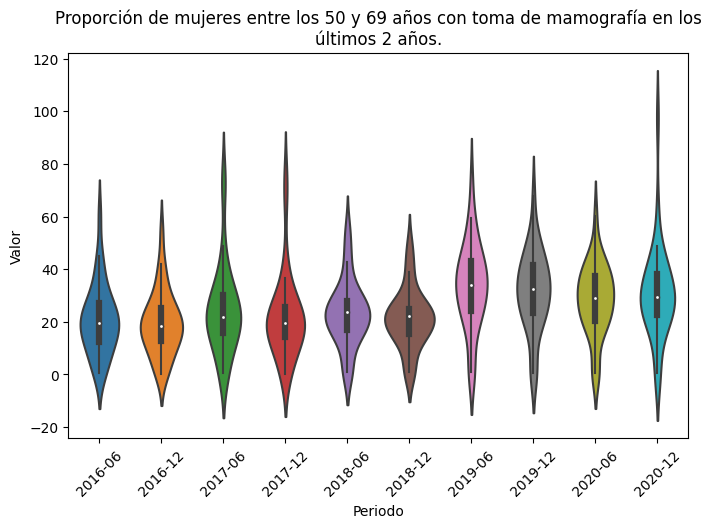

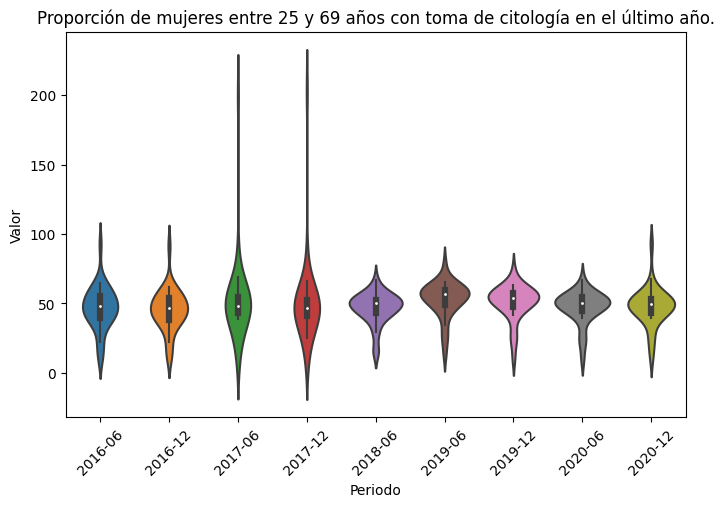

In [11]:
for indicador in indicador_proporciones:
    indicador_nacional=df_proporciones_ef[df_proporciones_ef["Indicador"]==indicador]
    plt.figure(figsize=(8, 5))
    plt.title('\n'.join(wrap(indicador,80)))
    sns.violinplot(data=indicador_nacional,x=indicador_nacional['Periodo'],y=indicador_nacional['Valor'])
    plt.xticks(rotation=45)
    plt.show()

Distplot

/tmp/ipykernel_13837/971458374.py:5: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=indicador_nacional,x=indicador_nacional['Valor'],hue=indicador_nacional['Periodo'], fill=True)


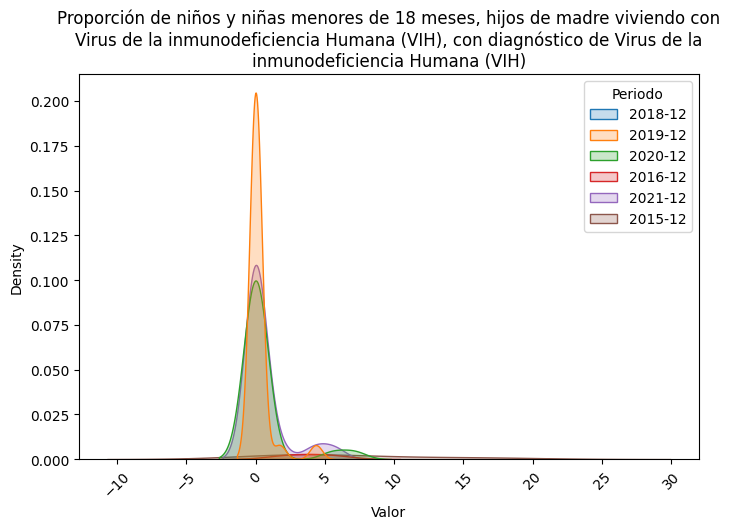

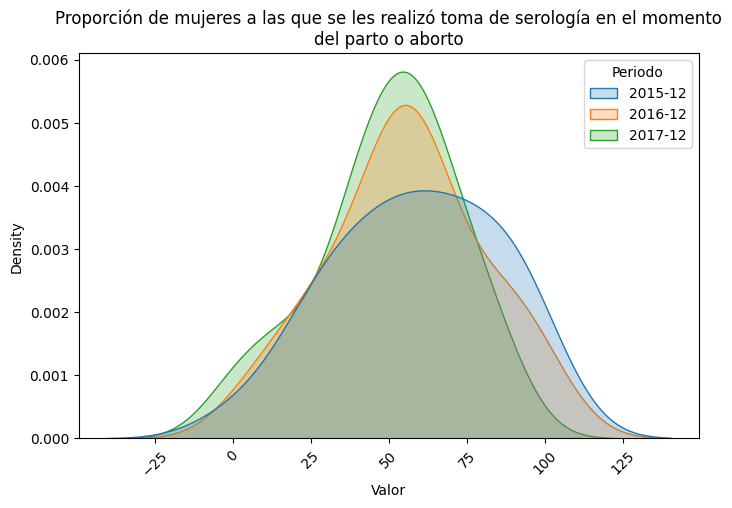

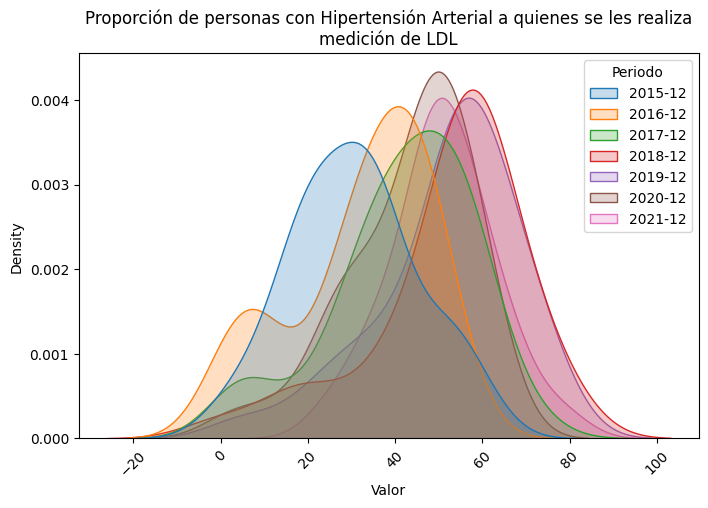

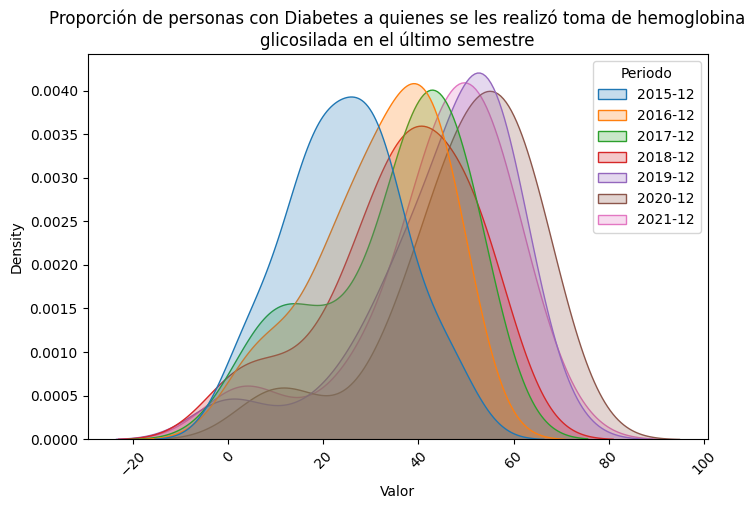

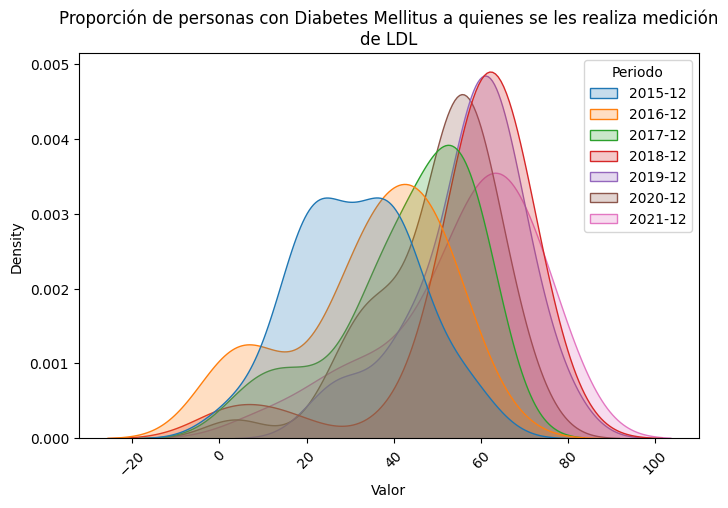

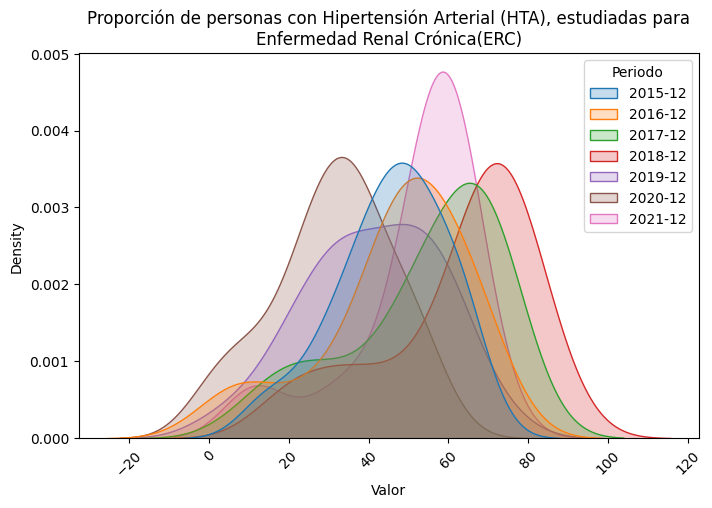

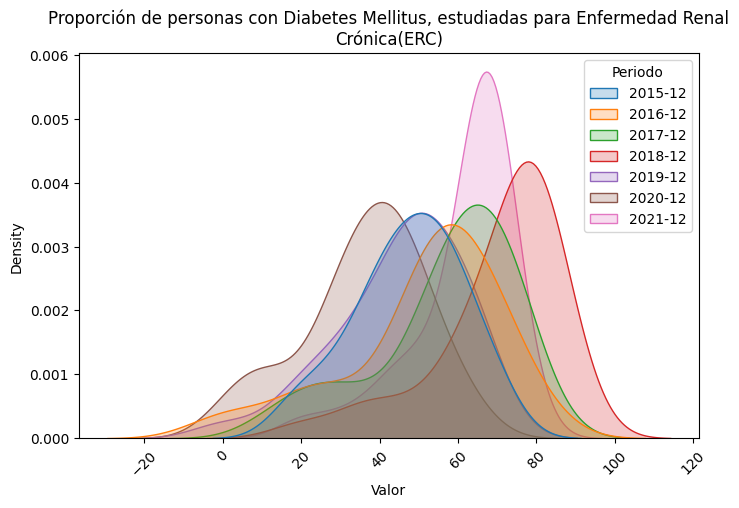

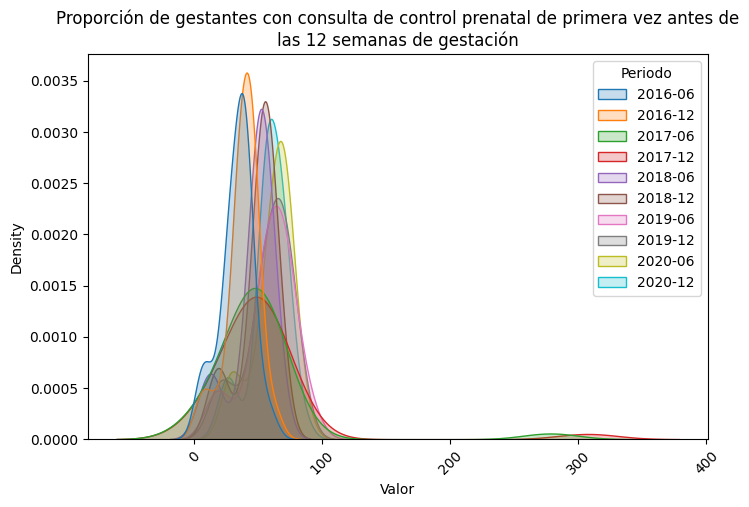

/tmp/ipykernel_13837/971458374.py:5: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=indicador_nacional,x=indicador_nacional['Valor'],hue=indicador_nacional['Periodo'], fill=True)


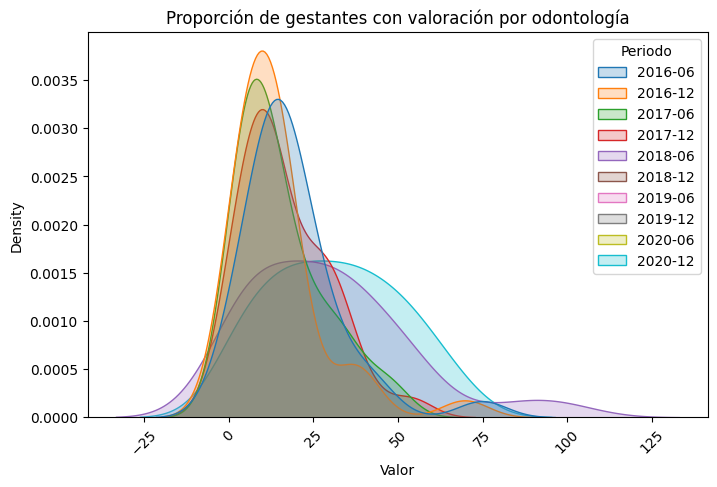

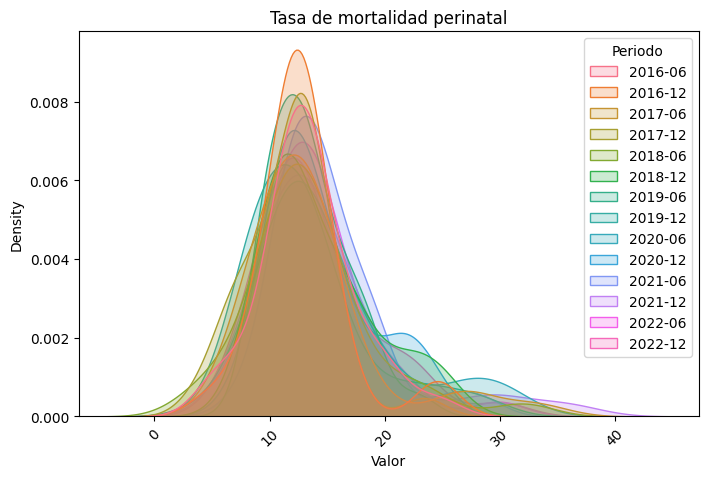

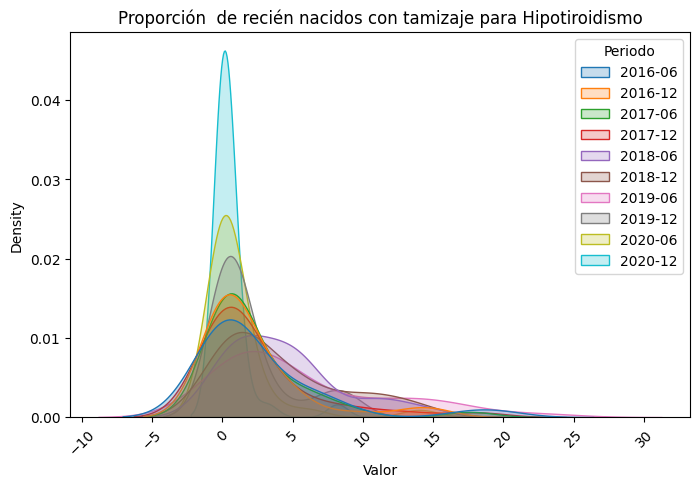

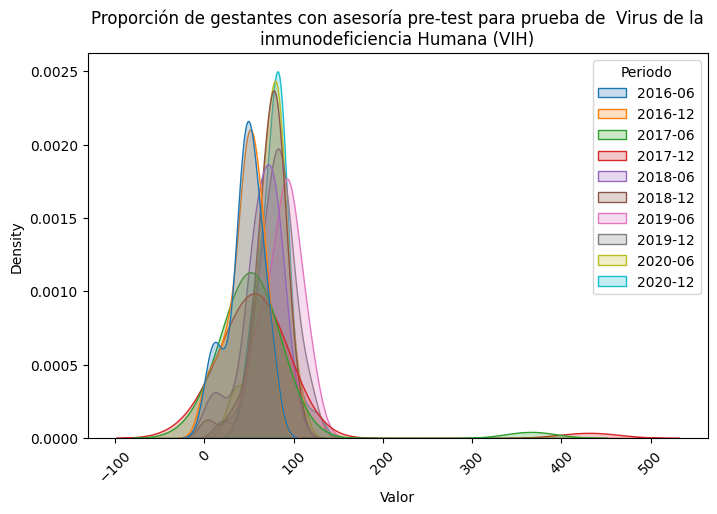

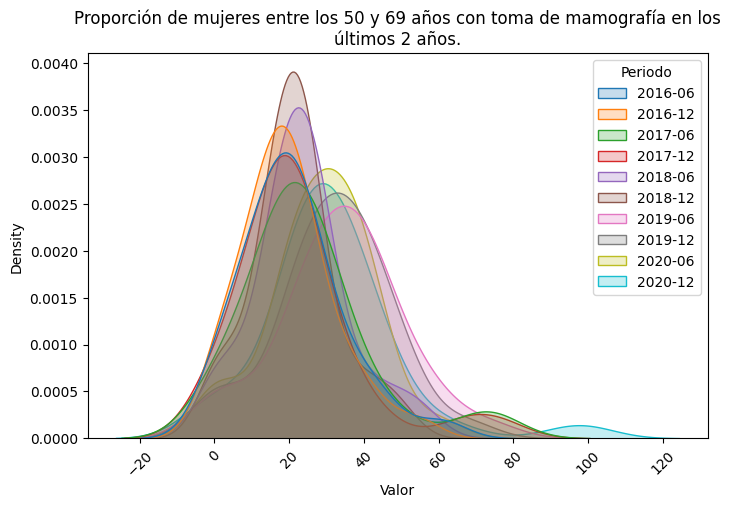

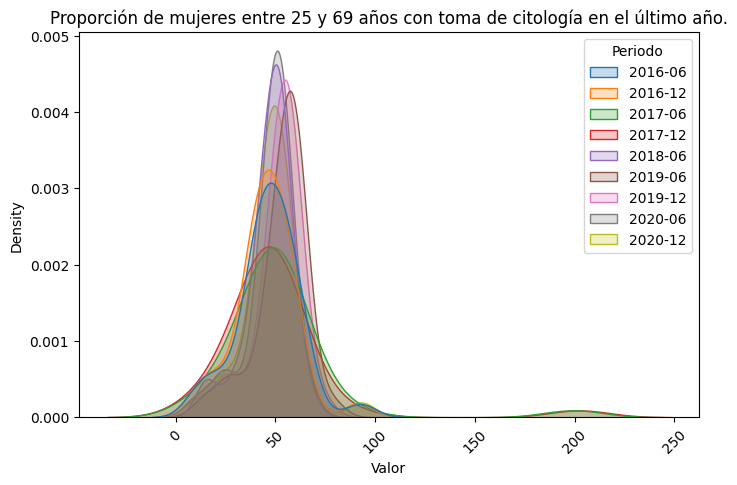

In [12]:
for indicador in indicador_proporciones:
    indicador_nacional=df_proporciones_ef[df_proporciones_ef["Indicador"]==indicador]
    plt.figure(figsize=(8, 5))
    plt.title('\n'.join(wrap(indicador,80)))
    sns.kdeplot(data=indicador_nacional,x=indicador_nacional['Valor'],hue=indicador_nacional['Periodo'], fill=True)
    plt.xticks(rotation=45)
    plt.show()

## Promedios por departamentos

lore ipsum

```python

In [13]:
indicadores_promedios=['Tiempo promedio de espera para el inicio del tratamiento en cáncer de mama',
       'Tiempo promedio de espera entre el diagnóstico probable y el diagnóstico definitivo Leucemia Aguda Pediátrica (LAP) en menores de 18 años']
df_promedios_ef_dep=df_efectividad[df_efectividad["Indicador"].isin(indicadores_promedios)]#seleccionar los registros que corresponden a los indicadores de proporciones
df_promedios_ef_dep=df_promedios_ef_dep[['Indicador','Departamento','Factor','Periodo','Numerador','Denominador']]# seleccionar las columnas de interés
df_promedios_ef_dep=df_promedios_ef_dep.groupby(['Indicador','Departamento','Factor','Periodo']).sum().reset_index()#agrupar por indicador, departamento y periodo
df_promedios_ef_dep['Departamento']=df_promedios_ef_dep['Departamento'].str.upper()#convertir a mayúsculas el nombre del departamento
df_promedios_ef_dep.head()

,Indicador,Departamento,Factor,Periodo,Numerador,Denominador
0,Tiempo promedio de espera entre el diagnóstico...,ANTIOQUIA,1,2016-12,129.0,20.0
1,Tiempo promedio de espera entre el diagnóstico...,ANTIOQUIA,1,2017-12,90.0,16.0
2,Tiempo promedio de espera entre el diagnóstico...,ANTIOQUIA,1,2018-12,586.0,30.0
3,Tiempo promedio de espera entre el diagnóstico...,ANTIOQUIA,1,2019-12,266.0,25.0
4,Tiempo promedio de espera entre el diagnóstico...,ANTIOQUIA,1,2020-12,60.0,16.0


In [14]:
promedio_seleccionado=indicadores_promedios[1]#seleccionar un indicador para realizar el mapa
df_mapa=df_promedios_ef_dep[df_promedios_ef_dep['Indicador']==promedio_seleccionado]#seleccionar un indicador para realizar el mapa
periodos=df_mapa['Periodo'].unique()#obtener los periodos
periodo_seleccionado=periodos[6]#seleccionar un periodo para realizar el mapa
df_mapa=df_mapa[df_mapa['Periodo']==periodo_seleccionado]#seleccionar un periodo para realizar el mapa
df_mapa

,Indicador,Departamento,Factor,Periodo,Numerador,Denominador
12,Tiempo promedio de espera entre el diagnóstico...,"BOGOTÁ, D.C.",1,2015-12,2604.0,47.0
19,Tiempo promedio de espera entre el diagnóstico...,BOLÍVAR,1,2015-12,107.0,6.0
26,Tiempo promedio de espera entre el diagnóstico...,CALDAS,1,2015-12,213.0,3.0
33,Tiempo promedio de espera entre el diagnóstico...,CAQUETÁ,1,2015-12,12.0,2.0
35,Tiempo promedio de espera entre el diagnóstico...,CESAR,1,2015-12,99.0,2.0
39,Tiempo promedio de espera entre el diagnóstico...,CÓRDOBA,1,2015-12,210.0,4.0
45,Tiempo promedio de espera entre el diagnóstico...,HUILA,1,2015-12,56.0,6.0
56,Tiempo promedio de espera entre el diagnóstico...,NARIÑO,1,2015-12,147.0,8.0
63,Tiempo promedio de espera entre el diagnóstico...,NORTE DE SANTANDER,1,2015-12,423.0,2.0
72,Tiempo promedio de espera entre el diagnóstico...,RISARALDA,1,2015-12,59.0,2.0


In [15]:
df_mapa=df_mapa.groupby('Departamento').sum().reset_index()#agrupar por departamento y calcular el promedio de los indicadores
df_mapa['Valor Departamental(días)']=round((df_mapa['Numerador']/df_mapa['Denominador'])*1,3)#calcular el valor nacional
df_mapa.head()

/tmp/ipykernel_13837/2523176807.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_mapa=df_mapa.groupby('Departamento').sum().reset_index()#agrupar por departamento y calcular el promedio de los indicadores


,Departamento,Factor,Numerador,Denominador,Valor Departamental(días)
0,"BOGOTÁ, D.C.",1,2604.0,47.0,55.404
1,BOLÍVAR,1,107.0,6.0,17.833
2,CALDAS,1,213.0,3.0,71.000
3,CAQUETÁ,1,12.0,2.0,6.000
4,CESAR,1,99.0,2.0,49.500


In [16]:
data_json= gpd.read_file('./data/Colombia_departamentos_poblacion.geojson', driver = "GeoJSON")
data_json=data_json.join(df_mapa.set_index('Departamento'), on='DPTO_CNMBR', how='left')
map = folium.Map(location=[4.570868, -74.297333],zoom_start=6)
cp=folium.Choropleth(
    geo_data=data_json,
    data=df_mapa,
    columns=['Departamento', 'Valor Departamental(días)'],
    key_on='feature.properties.DPTO_CNMBR',
    legend_name='Valor Departamental(días)',
    fill_color='BuPu',
    fill_opacity=0.8
).add_to(map)

cp.geojson.add_child(folium.GeoJsonTooltip(fields=['DPTO_CNMBR','Valor Departamental(días)'], #agregar el tooltip
                                           aliases=['Departamento','Valor Departamental(días)']))

#Añadir el titulo al mapa
title = '\n'.join(wrap((promedio_seleccionado + ' en ' + periodo_seleccionado),80))
title_html = """
            <div id='maplegend' class='maplegend' 
            style='position: absolute; z-index:9999; border:10px; background-color:rgba(200, 0, 255, 0.1);
             border-radius:6px; padding: 10px; font-size:15px; left: 15px; top: 700px;'>

            <div class='legend-title'><b>{}</b></div>
            </div>""".format(title)   
map.get_root().html.add_child(folium.Element(title_html))
map

In [17]:
indicadores_promedios=['Tiempo promedio de espera para el inicio del tratamiento en cáncer de mama',
       'Tiempo promedio de espera entre el diagnóstico probable y el diagnóstico definitivo Leucemia Aguda Pediátrica (LAP) en menores de 18 años']
df_promedios_ef=df_efectividad[df_efectividad["Indicador"].isin(indicadores_promedios)]#seleccionar los registros que corresponden a los indicadores de proporciones
df_promedios_ef.head()

,Indicador,CodDepto,Departamento,Factor,UnidadMedida,Periodo,Numerador,Denominador,Valor
224,Tiempo promedio de espera para el inicio del t...,5,Antioquia,1,Días,2016-12,6295.0,114.0,55.22
225,Tiempo promedio de espera para el inicio del t...,5,Antioquia,1,Días,2017-12,3076.0,52.0,59.15
226,Tiempo promedio de espera para el inicio del t...,5,Antioquia,1,Días,2018-12,1943.0,40.0,48.58
227,Tiempo promedio de espera para el inicio del t...,5,Antioquia,1,Días,2019-12,364.0,7.0,52.00
228,Tiempo promedio de espera para el inicio del t...,5,Antioquia,1,Días,2020-12,1328.0,25.0,53.12


lorem ipsum

```python

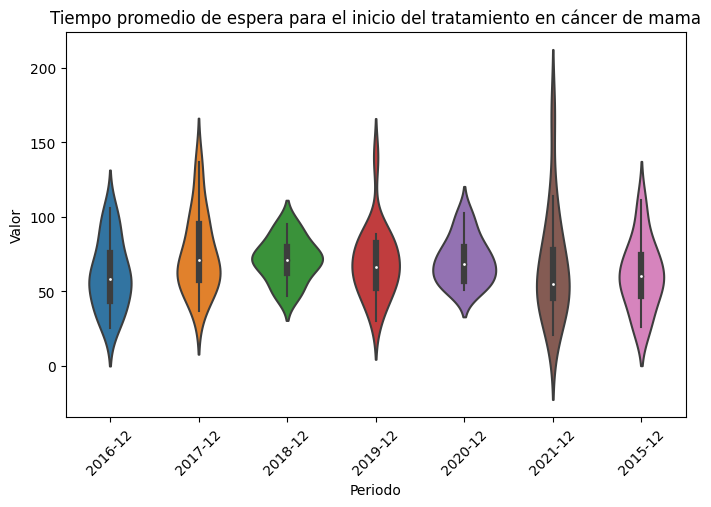

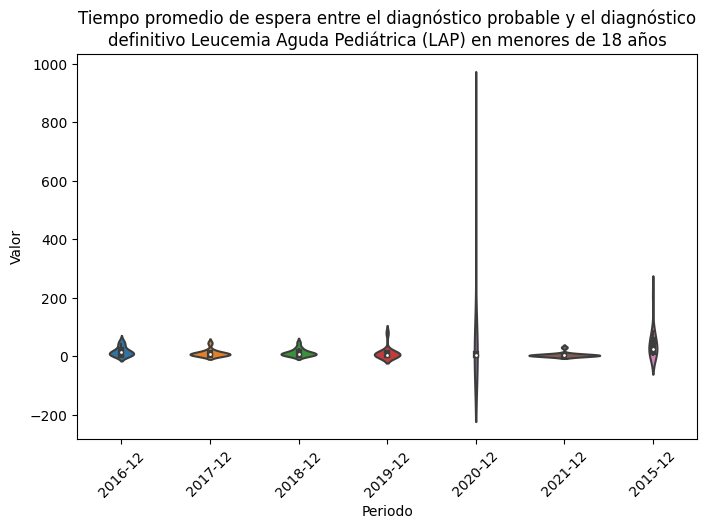

In [18]:
for indicador in indicadores_promedios:
    indicador_nacional=df_promedios_ef[df_promedios_ef["Indicador"]==indicador]
    plt.figure(figsize=(8, 5))
    plt.title('\n'.join(wrap(indicador,80)))
    sns.violinplot(data=indicador_nacional,x=indicador_nacional['Periodo'],y=indicador_nacional['Valor'])
    plt.xticks(rotation=45)
    plt.show()

lorem ipsum

```python

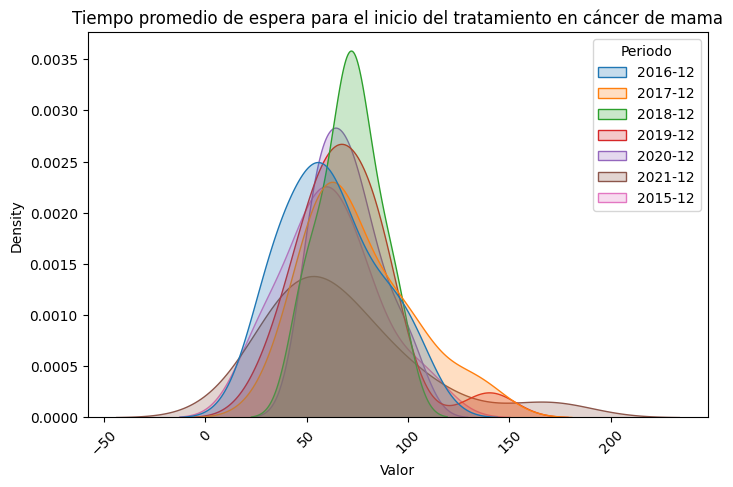

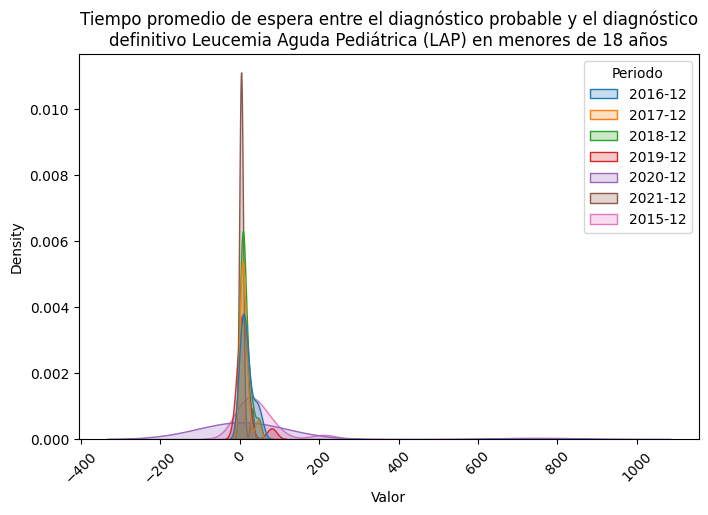

In [19]:
for indicador in indicadores_promedios:
    indicador_nacional=df_promedios_ef[df_promedios_ef["Indicador"]==indicador]
    plt.figure(figsize=(8, 5))
    plt.title('\n'.join(wrap(indicador,80)))
    sns.kdeplot(data=indicador_nacional,x=indicador_nacional['Valor'],hue=indicador_nacional['Periodo'], fill=True)
    plt.xticks(rotation=45)
    plt.show()

---

## Calculo de indicadores a nivel nacional

Primero vamos a revisar las proporciones y su comportamiento en el tiempo a nivel nacional, para esto calculamos un promedio nacional para cada uno de los indicadores a nivel nacional, esto se realiza sumando los numeradores y denominadores de todos los departamentos durante un periodo y calculanod un nuevo cociente

In [20]:
indicador_proporciones=['Proporción de niños y niñas menores de 18 meses, hijos de madre viviendo con Virus de la inmunodeficiencia Humana (VIH), con diagnóstico de Virus de la inmunodeficiencia Humana (VIH)',
       'Proporción de mujeres a las que se les realizó toma de serología en el momento del parto o aborto',
       'Proporción de personas con Hipertensión Arterial a quienes se les realiza medición de LDL',
       'Proporción de personas con Diabetes a quienes se les realizó toma de hemoglobina glicosilada en el último semestre',
       'Proporción de personas con Diabetes Mellitus a quienes se les realiza medición de LDL',
       'Proporción de personas con Hipertensión Arterial (HTA), estudiadas para Enfermedad Renal Crónica(ERC)',
       'Proporción de personas con Diabetes Mellitus, estudiadas para Enfermedad Renal Crónica(ERC)',
       'Proporción de gestantes con consulta de control prenatal de primera vez antes de las 12 semanas de gestación',
       'Proporción de gestantes con valoración por odontología',
       'Proporción  de recién nacidos con tamizaje para Hipotiroidismo',
       'Proporción de gestantes con asesoría pre-test para prueba de  Virus de la inmunodeficiencia Humana (VIH)',
       'Proporción de mujeres entre los 50 y 69 años con toma de mamografía en los últimos 2 años.',
       'Proporción de mujeres entre 25 y 69 años con toma de citología en el último año. ']
df_proporciones_ef=df_efectividad[df_efectividad["Indicador"].isin(indicador_proporciones)]
df_proporciones_ef.head()

,Indicador,CodDepto,Departamento,Factor,UnidadMedida,Periodo,Numerador,Denominador,Valor
0,Proporción de niños y niñas menores de 18 mese...,91,Amazonas,100,Porcentaje,2018-12,0.0,1.0,0.00
1,Proporción de niños y niñas menores de 18 mese...,91,Amazonas,100,Porcentaje,2019-12,0.0,1.0,0.00
2,Proporción de niños y niñas menores de 18 mese...,91,Amazonas,100,Porcentaje,2020-12,0.0,2.0,0.00
3,Proporción de mujeres a las que se les realizó...,91,Amazonas,100,Porcentaje,2015-12,0.0,1.0,0.00
4,Proporción de mujeres a las que se les realizó...,91,Amazonas,100,Porcentaje,2016-12,33.0,38.0,86.84


Ahora podemos hacer un lineplot para cada indicador que muestre el comportamiento durante los diferenetes periodos, esto lo hacemos utilizando la libreria seaborn

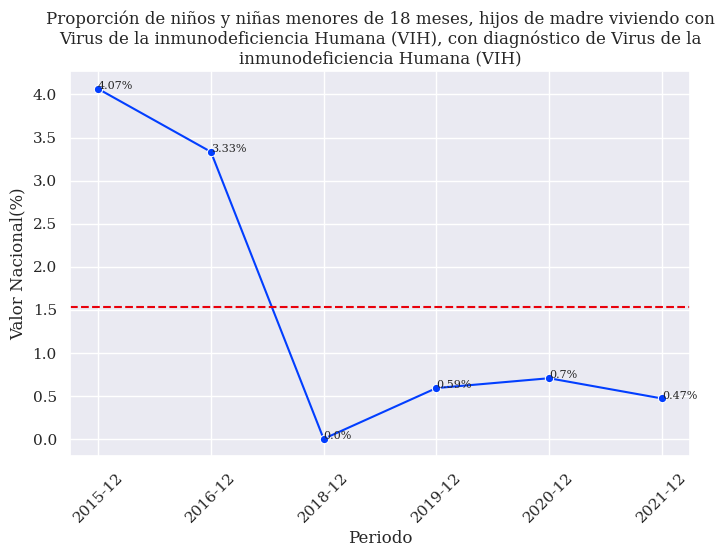

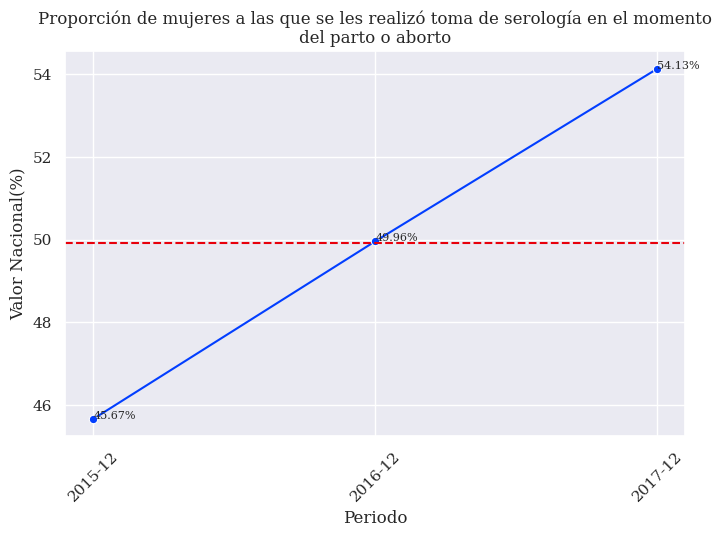

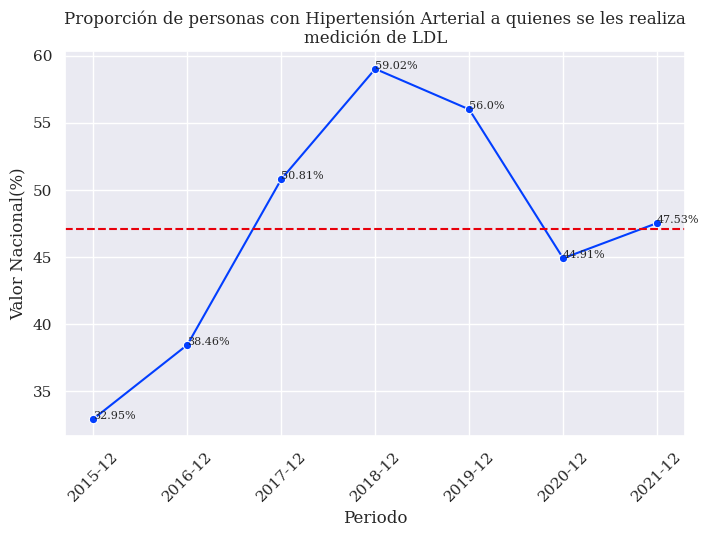

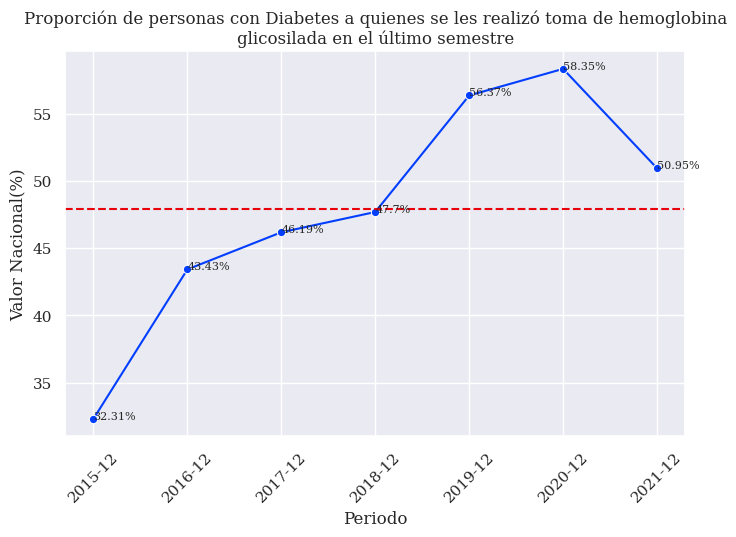

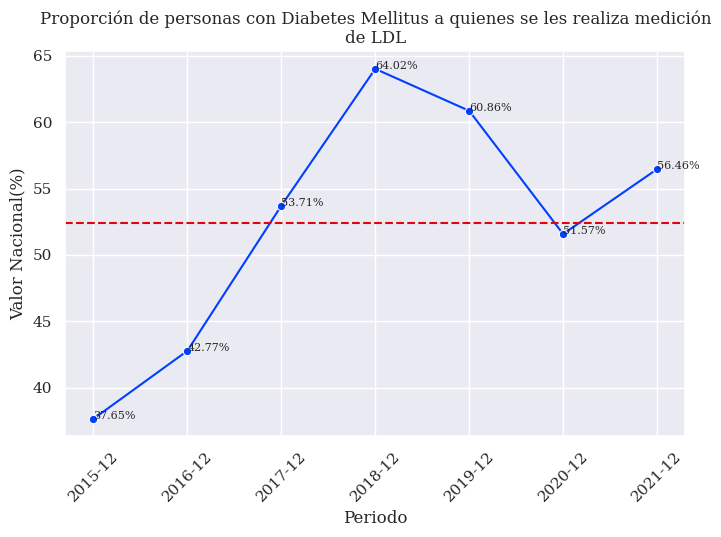

...

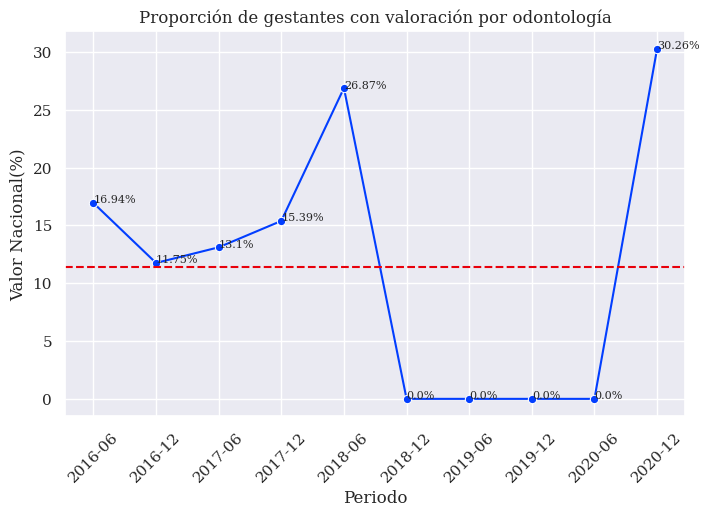

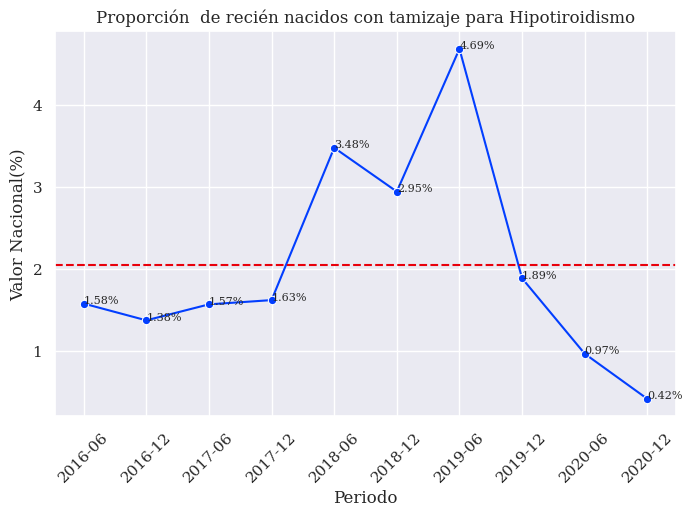

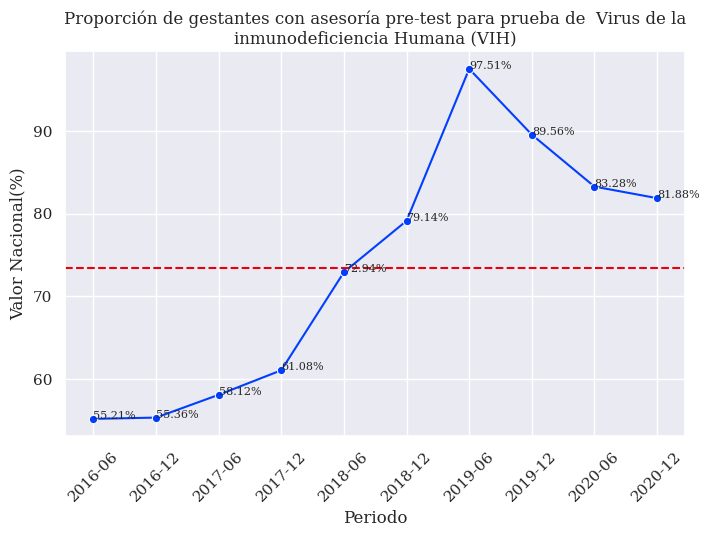

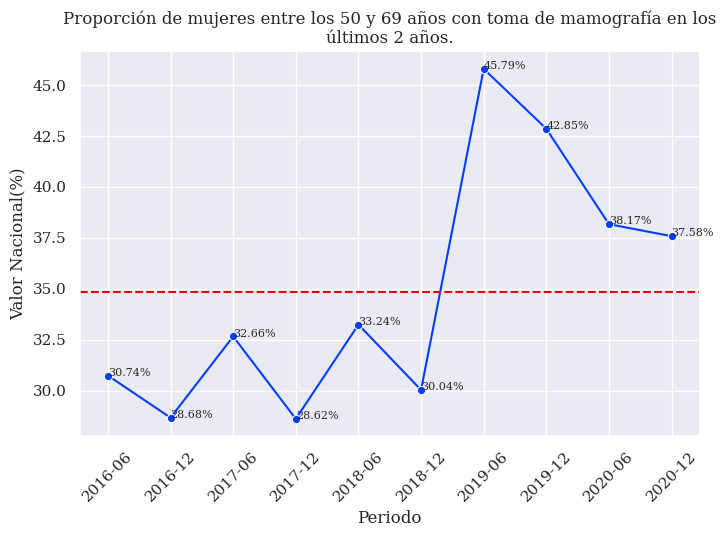

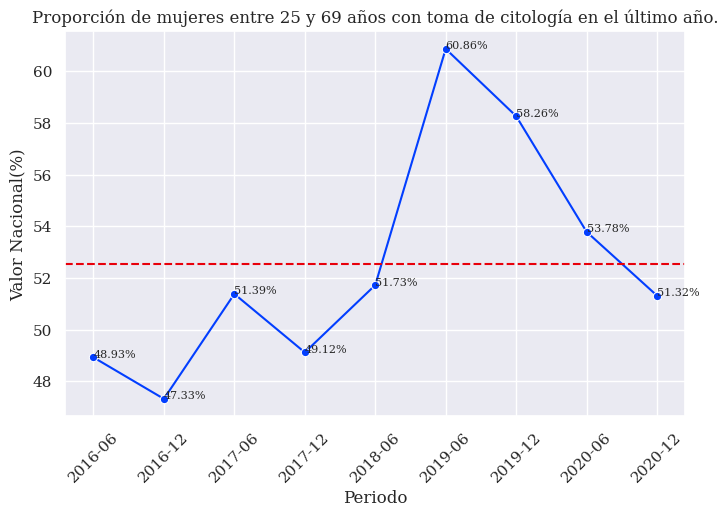

In [21]:
sns.set_theme(context='notebook', style='darkgrid', palette='bright', font='serif', font_scale=1, color_codes=True, rc=None)
for indicador in indicador_proporciones:
    indicador_nacional=df_proporciones_ef[df_proporciones_ef["Indicador"]==indicador]
    indicador_nacional=indicador_nacional[['Indicador','Factor','UnidadMedida','Periodo','Numerador','Denominador']].groupby(['Indicador','UnidadMedida','Factor','Periodo']).sum().reset_index()
    indicador_nacional['Valor Nacional(%)']=(indicador_nacional['Numerador']/indicador_nacional['Denominador'])*indicador_nacional['Factor']
    plt.figure(figsize=(8, 5))
    plt.title('\n'.join(wrap(indicador,80)))
    sns.lineplot(x='Periodo', y='Valor Nacional(%)',data=indicador_nacional, marker='o')
    plt.xticks(rotation=45)
    font = {'family': 'serif',
            'weight': 'normal',
            'size': 8}

    for index, row in indicador_nacional.iterrows():
        plt.text(row['Periodo'], row['Valor Nacional(%)'], str(round(row['Valor Nacional(%)'],2))+"%", ha='left',fontdict=font)
    plt.axhline(y=indicador_nacional['Valor Nacional(%)'].mean(), color='r', linestyle='--')
    plt.show()

Podemos ver que los siguientes indicadores y tuvieron un ccomportamiento favorable para el estado de la efectividad en la salud durante los periodos en que fueron calculado, es decir a medidad que pasa el tiempo el indicador muestra que la efectividad del sistema mejoró, estos indicadores son:
* ***Proporción de niños y niñas menores de 18 meses, hijos de madre viviendo con Virus de la inmunodeficiencia Humana (VIH), con diagnóstico de Virus de la inmunodeficiencia Humana (VIH):*** el porcentaje de niños diagnosticados con VIH aunque siempre ha tenido un valor pequeños, entre 2015 y 2021 este se redujo hasta alcanza un porcentaje que parece mantener por debajo del 1% del numero total de hijos de madres diagnosticadas con VIH
* ***Proporción de mujeres a las que se les realizó toma de serología en el momento del parto o aborto:*** aunque para este indicador solo se calcularon tres periodos podemos ver que el porcentaje de mujeres a las que se les realizó la toma de serología en el momento del parto o aborto se incrementó en un 10% entre 2015 y 2021
* ***Proporción de personas con Diabetes a quienes se les realizó toma de hemoglobina glicosilada en el último semestre:*** para este indicador se puede ver que el numero de personas con diabetes a las que se les realizó la toma de hemoglobina glicosilada en el último semestre se incrementó en un 10% entre 2015 y 2021, y entre 2015 y 2020 se mantuvo un crecimiento constante

* ***Proporción de gestantes con consulta de control prenatal de primera vez antes de las 12 semanas de gestación:*** este indicador respresenta un buen ejemplo de como se ha incrementado su valor a través de varios periodos permitiendonos concluir que la efectividad si ha mejorado

El resto de los indicadores o bien han tenido un comportamiento desfavorable, es decir, que han afectado negativamente el estado de la efectividad, o bien tienen comportmaientos que resultan ser inconclusos

Ahora realizamos el mismo proceso pero para llos indicadores que corresponden a promedios cuyos valores representan días

In [22]:
indicadores_promedios=['Tiempo promedio de espera para el inicio del tratamiento en cáncer de mama',
       'Tiempo promedio de espera entre el diagnóstico probable y el diagnóstico definitivo Leucemia Aguda Pediátrica (LAP) en menores de 18 años']
df_promedios_ef=df_efectividad[df_efectividad["Indicador"].isin(indicadores_promedios)]

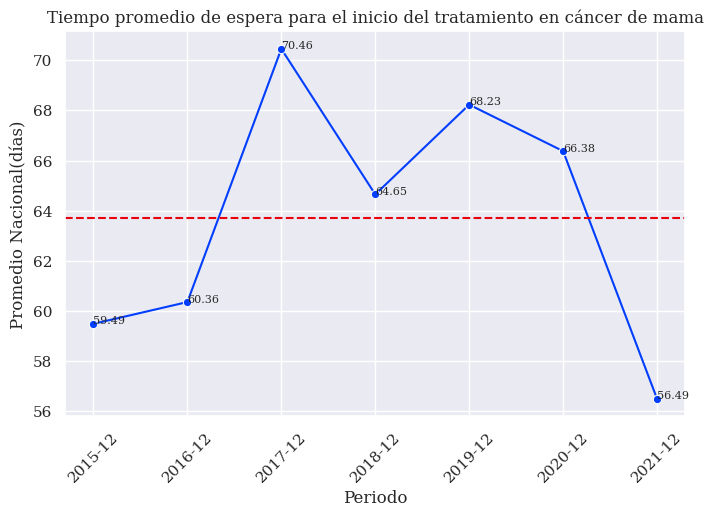

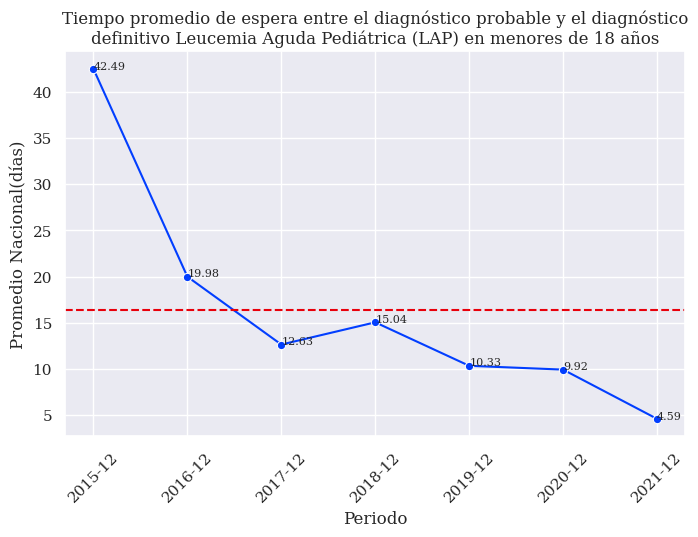

In [23]:
sns.set_theme(context='notebook', style='darkgrid', palette='bright', font='serif', font_scale=1, color_codes=True, rc=None)
for indicador in indicadores_promedios:
    indicador_nacional=df_promedios_ef[df_promedios_ef["Indicador"]==indicador]
    indicador_nacional=indicador_nacional[['Indicador','Factor','UnidadMedida','Periodo','Numerador','Denominador']].groupby(['Indicador','UnidadMedida','Factor','Periodo']).sum().reset_index()
    indicador_nacional['Promedio Nacional(días)']=(indicador_nacional['Numerador']/indicador_nacional['Denominador'])*indicador_nacional['Factor']
    plt.figure(figsize=(8, 5))
    plt.title('\n'.join(wrap(indicador,80)))
    sns.lineplot(x='Periodo', y='Promedio Nacional(días)',data=indicador_nacional, marker='o')
    plt.xticks(rotation=45)
    font = {'family': 'serif',
            'size': 8}
    for index, row in indicador_nacional.iterrows():
        plt.text(row['Periodo'], row['Promedio Nacional(días)'], str(round(row['Promedio Nacional(días)'],2)), ha='left',fontdict=font)
    plt.axhline(y=indicador_nacional['Promedio Nacional(días)'].mean(), color='r', linestyle='--')
    plt.show()

Para los tiempos promedios vemos que para el Tiempo promedio de espera entre el diagnostico probable y el diagnostico definitvo de LAP en menores de 18 años este si disminuye continuamente y para el 2021 tiene un tiempo promedio significativamente menor respecto al 2015, sin embargo para el tiempo promedio de espera para el inicio del tratamiento de cancer de mama continua siendo muy irregular.

Por último hacemos el mismo proceso para la Tasa de mortalidad perinatal que resulta ser el unico indicador calculado como tasa en este dominio

In [24]:
indicadores_tasas=['Tasa de mortalidad perinatal',]
df_tasas_ef=df_efectividad[df_efectividad["Indicador"].isin(indicadores_tasas)]

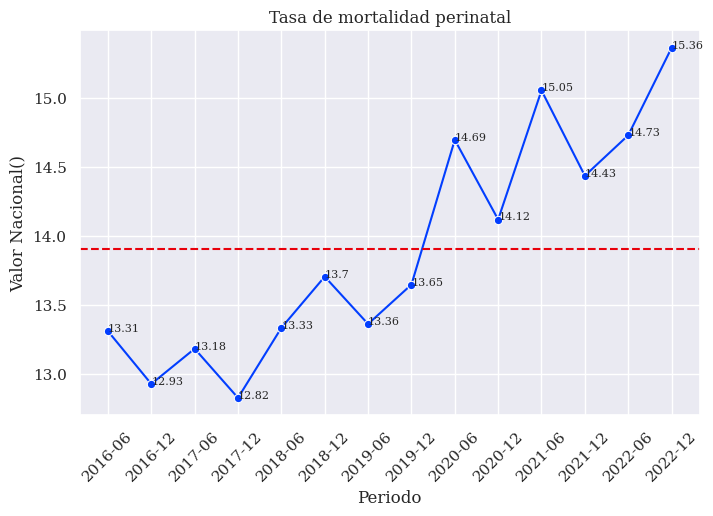

In [25]:
sns.set_theme(context='notebook', style='darkgrid', palette='bright', font='serif', font_scale=1, color_codes=True, rc=None)
for indicador in indicadores_tasas:
    indicador_nacional=df_tasas_ef[df_tasas_ef["Indicador"]==indicador]
    indicador_nacional=indicador_nacional[['Indicador','Factor','UnidadMedida','Periodo','Numerador','Denominador']].groupby(['Indicador','UnidadMedida','Factor','Periodo']).sum().reset_index()
    indicador_nacional['Valor Nacional()']=(indicador_nacional['Numerador']/indicador_nacional['Denominador'])*indicador_nacional['Factor']
    plt.figure(figsize=(8, 5))
    plt.title('\n'.join(wrap(indicador,80)))
    sns.lineplot(x='Periodo', y='Valor Nacional()',data=indicador_nacional, marker='o')
    plt.xticks(rotation=45)
    font = {'family': 'serif',
            'size': 8}
    for index, row in indicador_nacional.iterrows():
        plt.text(row['Periodo'], row['Valor Nacional()'], str(round(row['Valor Nacional()'],2)), ha='left',fontdict=font)
    plt.axhline(y=indicador_nacional['Valor Nacional()'].mean(), color='r', linestyle='--')
    plt.show()

Como vemos esta tasa se ha incrementado de manera casi constante desde el 2016 hasta el 2022, la tasa define el número de defunciones que ocurren en el periodo comprendido entre las 22 semanas completas (154 días) de gestación y/o con 500 gramos o más de peso fetal, hasta antes de los siete días después del nacimiento, esto significa que ha ido aumentando esta tasa lo que nos lleva a concluir que la efectividad en la salud no ha mejorado para este indicador y por el contrario ha empeorado

```python

### Resumen de los indicadores nacionales en mapas de calor

Para ver el comportmaiento en grupo de los indicadores de efectividad se realizan mapas de color que nos muestre el valor del indicador para cada uno de los periodos, de igual manera acá podemos visualizar de forma más resumida cuales de los indicadores tuvieron un comportamiento favorable

([<matplotlib.axis.XTick at 0x7fd673c5b5b0>,
 [Text(0.5, 0, 'Proporción  de recién nacidos con tamizaje para Hipotiroidismo'),
  Text(1.5, 0, 'Proporción de gestantes con asesoría pre-test para prueba de  Virus de la inmunodeficiencia Humana\n(VIH)'),
  Text(2.5, 0, 'Proporción de gestantes con consulta de control prenatal de primera vez antes de las 12 semanas de\ngestación'),
  Text(3.5, 0, 'Proporción de gestantes con valoración por odontología'),
  Text(4.5, 0, 'Proporción de mujeres a las que se les realizó toma de serología en el momento del parto o aborto'),
  Text(5.5, 0, 'Proporción de mujeres entre 25 y 69 años con toma de citología en el último año.'),
  Text(6.5, 0, 'Proporción de mujeres entre los 50 y 69 años con toma de mamografía en los últimos 2 años.'),
  Text(7.5, 0, 'Proporción de niños y niñas menores de 18 meses, hijos de madre viviendo con Virus de la\ninmunodeficiencia Humana (VIH), con diagnóstico de Virus de la inmunodeficiencia Humana (VIH)'),
  Text(8.5, 0, 

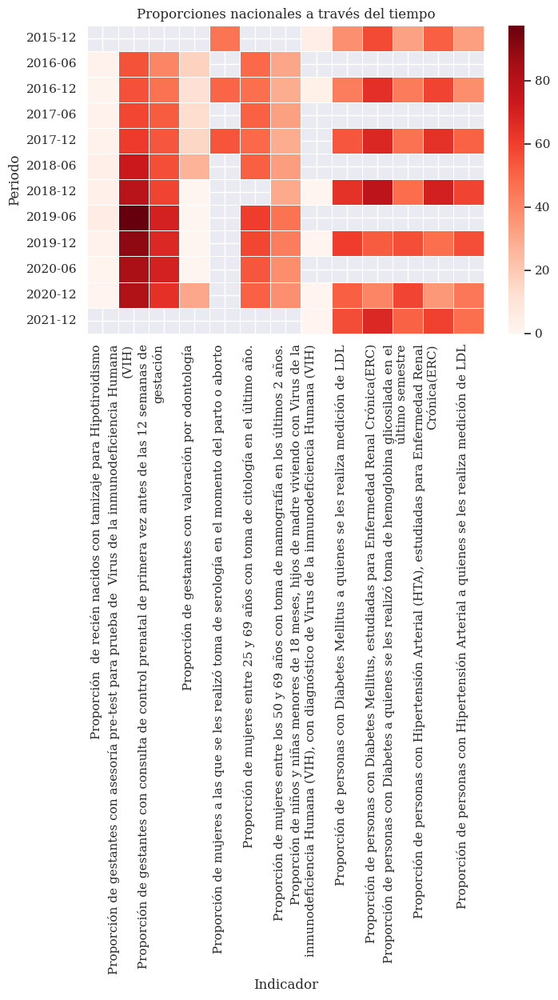

In [26]:
df=df_proporciones_ef[['Indicador','Factor','UnidadMedida','Periodo','Numerador','Denominador']].groupby(['Indicador','UnidadMedida','Factor','Periodo']).sum().reset_index()
df['Valor nacional(%)']=(df['Numerador']/df['Denominador'])*df['Factor']
pivot=pd.pivot_table(df,index='Periodo',columns='Indicador',values='Valor nacional(%)')
plt.figure(figsize=(8, 5))
title='Proporciones nacionales a través del tiempo'
plt.title('\n'.join(wrap(title,80)))
sns.heatmap(pivot, cmap="Reds", linewidths=.5, xticklabels=True, yticklabels=True)
xlabels = ['\n'.join(wrap(l.get_text(), 100)) for l in plt.gca().get_xticklabels()]
plt.xticks(ticks=plt.xticks()[0], labels=xlabels, ha='right')

([<matplotlib.axis.XTick at 0x7fd67c989ab0>,
 [Text(0.5, 0, 'Tiempo promedio de espera entre el diagnóstico\nprobable y el diagnóstico definitivo Leucemia\nAguda Pediátrica (LAP) en menores de 18 años'),
  Text(1.5, 0, 'Tiempo promedio de espera para el inicio del\ntratamiento en cáncer de mama')])

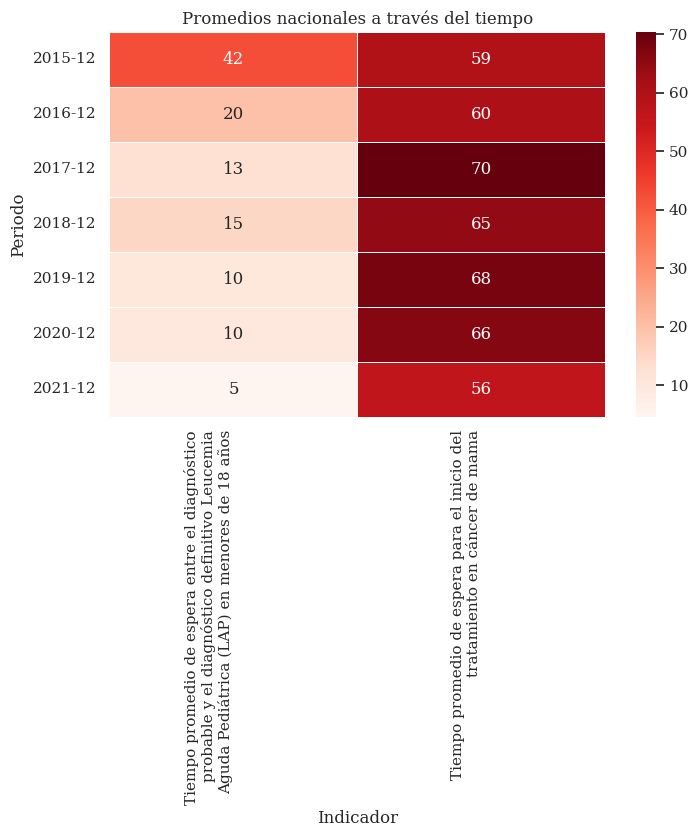

In [27]:
df=df_promedios_ef[['Indicador','Factor','UnidadMedida','Periodo','Numerador','Denominador']].groupby(['Indicador','UnidadMedida','Factor','Periodo']).sum().reset_index()
df['Valor nacional(días)']=(df['Numerador']/df['Denominador'])*df['Factor']
pivot=pd.pivot_table(df,index='Periodo',columns='Indicador',values='Valor nacional(días)')
plt.figure(figsize=(8, 5))
title='Promedios nacionales a través del tiempo'
plt.title('\n'.join(wrap(title,80)))
sns.heatmap(pivot, cmap="Reds", annot=True, fmt=".0f", linewidths=.5, xticklabels=True, yticklabels=True)
xlabels = ['\n'.join(wrap(l.get_text(), 50)) for l in plt.gca().get_xticklabels()]
plt.xticks(ticks=plt.xticks()[0], labels=xlabels, ha='right')

## Prediccion de valores futuros mediante ajuste polinomial

Seleccionamos los periodos y los valores nacionales calculados para realizar el ajuste polinomial, de esta manera tenemos dos series de datos x y y con los que podemos predecir el ultimo año para cada indicador, para esto utilizamos uno de los indicadores el cual es Proporcion de personas con Hipertension Arterial a quienes se les realiza medición de LDL

In [28]:
indicador='Proporción de personas con Diabetes a quienes se les realizó toma de hemoglobina glicosilada en el último semestre'
indicador_nacional=df_proporciones_ef[df_proporciones_ef["Indicador"]==indicador]
indicador_nacional=indicador_nacional[['Indicador','Factor','UnidadMedida','Periodo','Numerador','Denominador']].groupby(['Indicador','UnidadMedida','Factor','Periodo']).sum().reset_index()
indicador_nacional['Valor Nacional(%)']=(indicador_nacional['Numerador']/indicador_nacional['Denominador'])*indicador_nacional['Factor']
x=indicador_nacional['Periodo']
y=indicador_nacional['Valor Nacional(%)']
x=pd.to_datetime(x, format='%Y-%m-%d',errors='coerce')
x=x.dt.year

Creamos 4 conjuntos de datos que van a hacer utilizados para realizar el ajuste polinomial, estos conjuntos de datos son:
* ***x_train***: conjunto de datos que contiene los periodos que van a ser utilizados para entrenar el modelo
* ***y_train***: conjunto de datos que contiene los valores de los indicadores que van a ser utilizados para entrenar el modelo
* ***x_test***: conjunto de datos que contiene los periodos que van a ser utilizados para probar el modelo
* ***y_test***: conjunto de datos que contiene los valores de los indicadores que van a ser utilizados para probar el modelo

Debido a la pequeña cantidad de datos que tenemos para entrenar el modelo,se utiliza como prueba el ultimo periodo del indicador

In [29]:
x_test=x.iloc[len(x)-1]
y_test=y.iloc[len(y)-1]
x_train=x.drop(len(x)-1)
y_train=y.drop(len(x)-1)


Aca podemos ver la diferencia absoluta entrel el valor predecido para un polinomio de grado 5 y el valor real, como vemos es un valor demasiado grande debido a que no sabemos el grado correcto del polinomio a utilizar

In [30]:
periodo=x_test
coef=np.polyfit(x_train, y_train, 5)
p=np.polyval(coef,periodo)
print(abs(p-y_test))

13.82297517404021


/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


Debido a que no conocemos cual es el grado del polinomio que mejor se ajusta a los datos, vamos a utilizar dos estreategias para decidir esto, las dos estrategias son:
* ***Error cuadratico medio***: se trata de calcular las ditancias entre el el polinomio y los valores reales para determinar cual es el grado del polinomio que minimiza el error cuadratico medio
* ***Error en la predicción***: se trata de calcular la difrencia absoluta entre el valor real y el valor predecido para determinar cual es el grado del polinomio que minimiza el error en la predicción

### Error cuadrático medio MSE

Vamos a realizar una iteración sobre el grado del polinomio y determinar para cada uno de ellos el error cuadrático medio, de esta manera podemos determinar cual es el grado del polinomio que mejor se ajusta a los datos.

/tmp/ipykernel_13837/2567624794.py:10: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for index, value in x_train.iteritems():# se recorre la serie de entrenamiento
/tmp/ipykernel_13837/2567624794.py:10: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for index, value in x_train.iteritems():# se recorre la serie de entrenamiento
/tmp/ipykernel_13837/2567624794.py:10: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for index, value in x_train.iteritems():# se recorre la serie de entrenamiento
/tmp/ipykernel_13837/2567624794.py:10: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for index, value in x_train.iteritems():# se recorre la serie de entrenamiento
/tmp/ipykernel_13837/2567624794.py:10: FutureWarning: iteritems is deprecated and will be removed in a future version. U

Text(15, 20, 'Error mínimo:2.2637363841581285e-09\nGrado del polinomio:52')

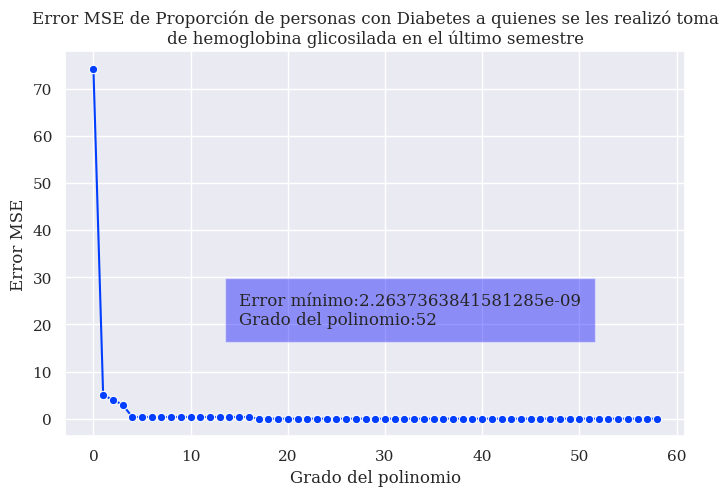

In [31]:
errorsMSE=pd.Series(dtype=float)

for i in range(0,59):
    periodo=x_test# x que se va a predecir
    coef=np.polyfit(x_train, y_train, i)# polino del grado i
    p=np.polyval(coef,periodo)# prediccion con el polinomio del grado i
    if p<0:# si la prediccion es negativa se pone en 0
        p=0    
    y_pred=pd.Series(dtype=float)# serie de prediccion
    for index, value in x_train.iteritems():# se recorre la serie de entrenamiento
        y_pred.loc[index]=np.polyval(coef,value)# se predice cada valor de la serie de entrenamiento
    MSE=(sum((y_train-y_pred)**2))/len(y_train)# error cuadratico medio
    errorsMSE.loc[i]=MSE# se guarda el error en la serie de errores


fig=plt.figure(figsize=(8, 5))
ax = fig.add_subplot(111)

plt.title('\n'.join(wrap('Error MSE de '+indicador,80)))
sns.lineplot(x=errorsMSE.index, y=errorsMSE, marker='o')
plt.xlabel('Grado del polinomio')
plt.ylabel('Error MSE')

textstr='Error mínimo:' + str(min(errorsMSE))+ '\nGrado del polinomio:'+str(errorsMSE.idxmin())
ax.text(15, 20, textstr, bbox={'facecolor': 'blue', 'alpha': 0.4, 'pad': 10})

Podemos visualizar graficamente este ajuste polinomial con cada uno de los grados de 0  hasta 55  como vemos en cada iteración el polinomio se ajusta más a los datos, sin embargo esto no significa que sea el mejor polinomio. Por eso usamos el MSE para tomar una decisión, de igual manera realizamos una predicción para el ultimo periodo el cual podemos ver en verde

/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(c

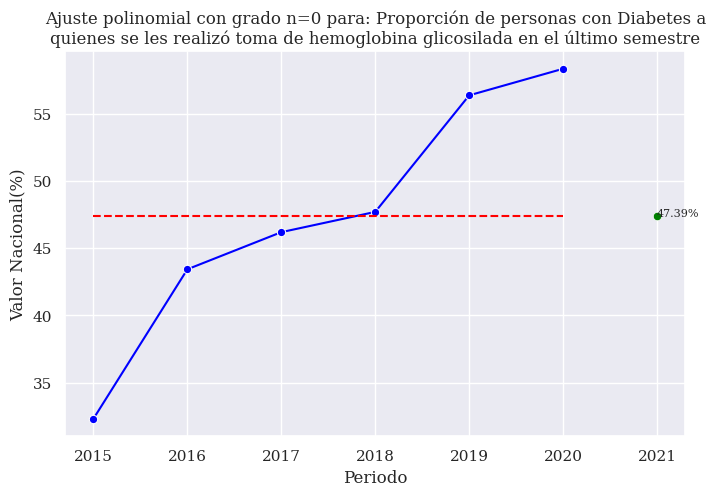

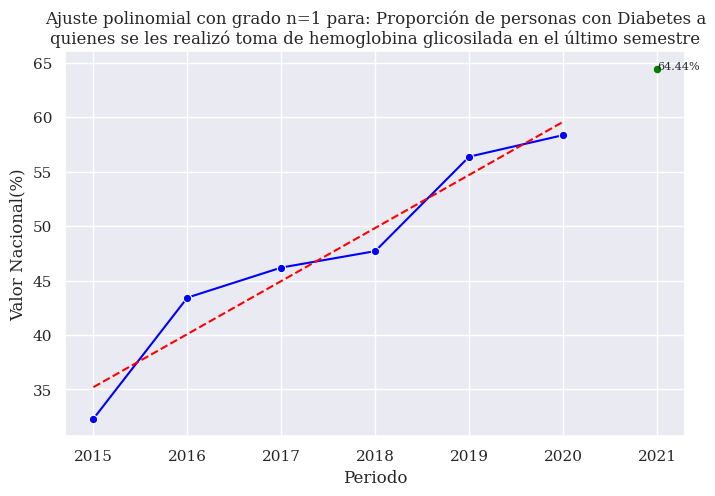

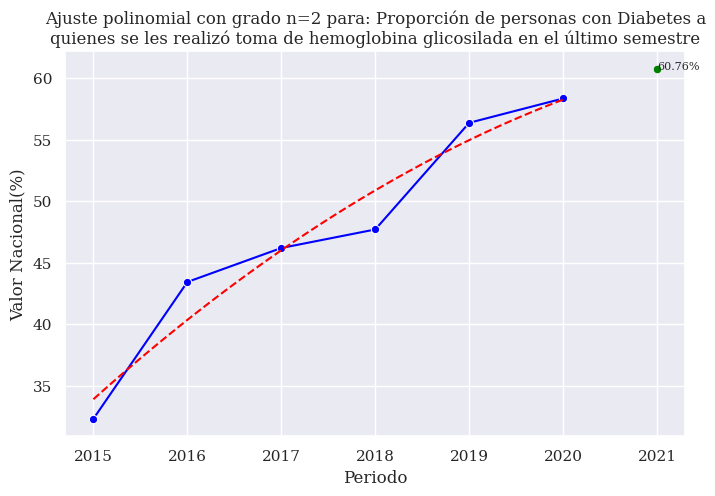

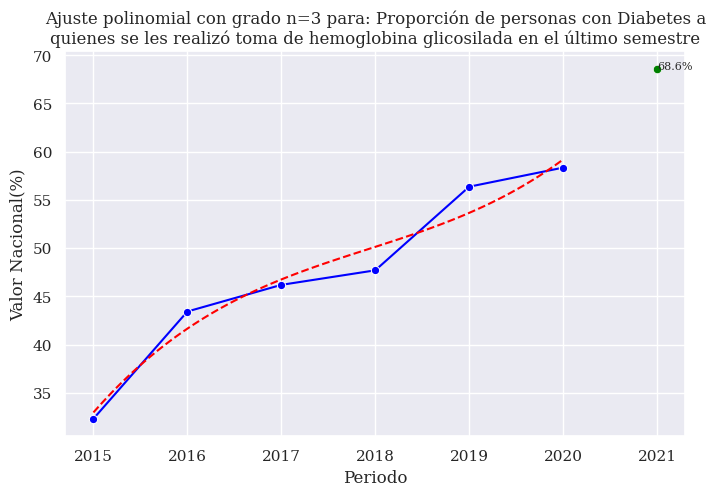

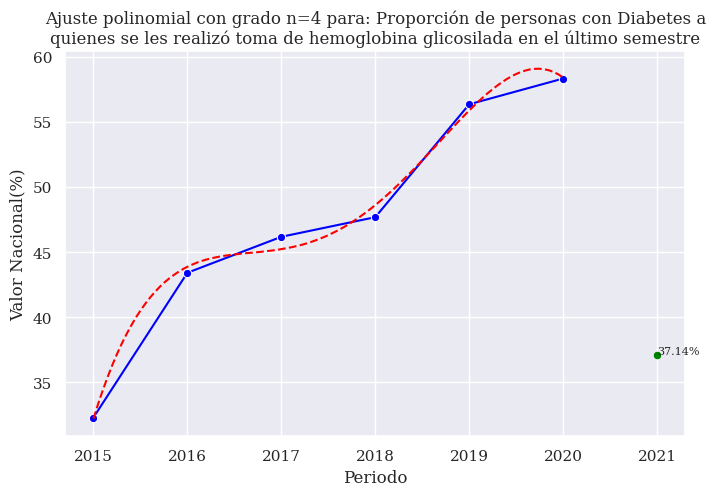

...

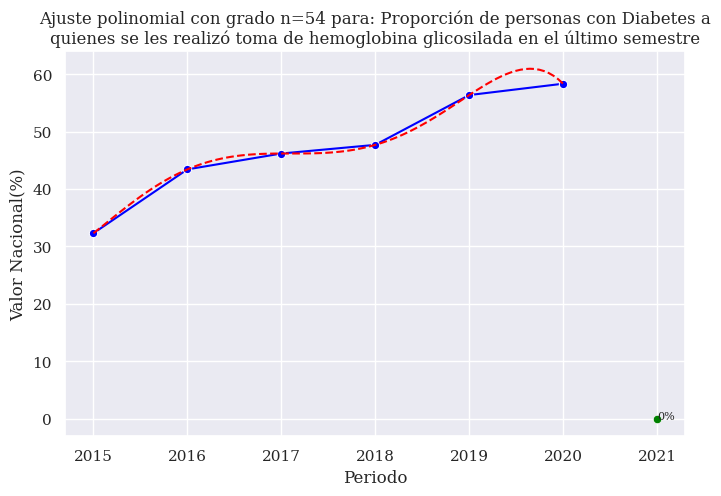

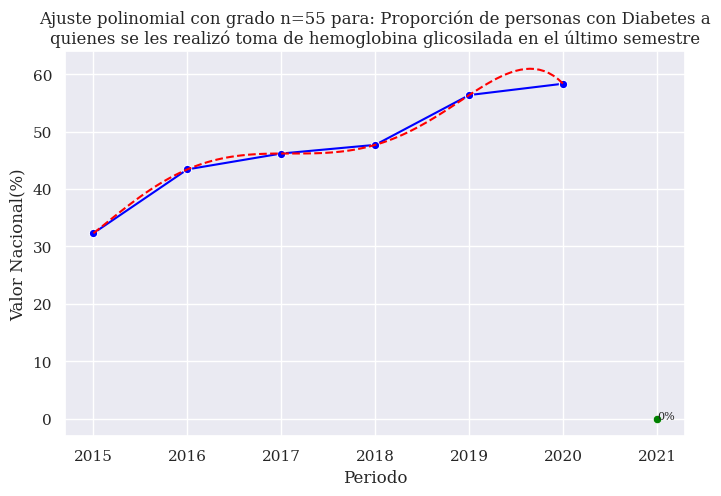

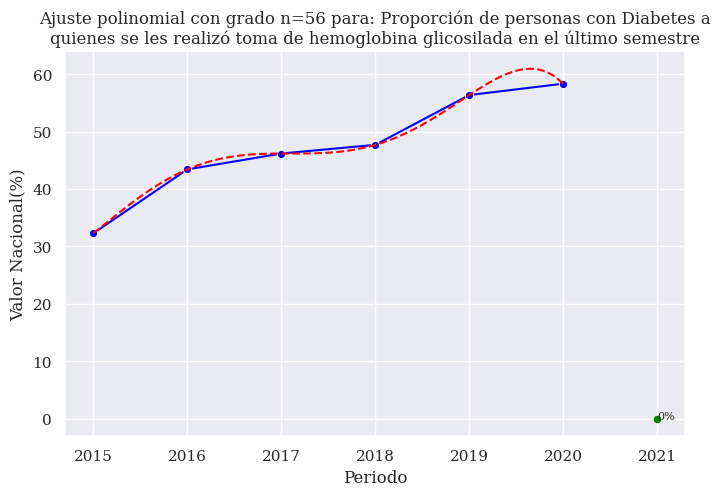

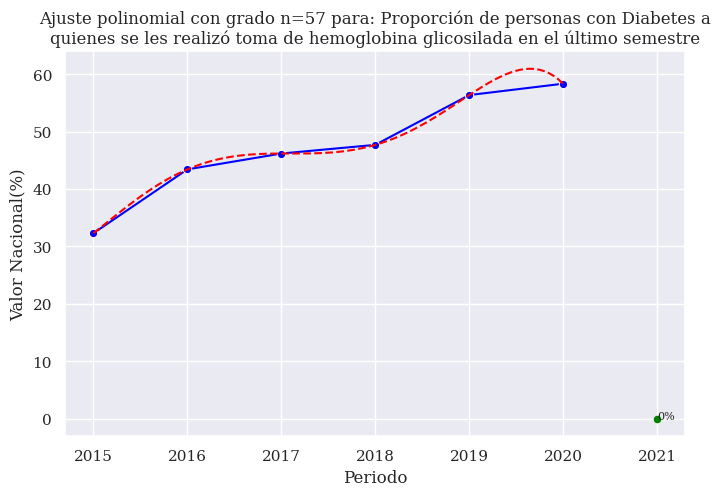

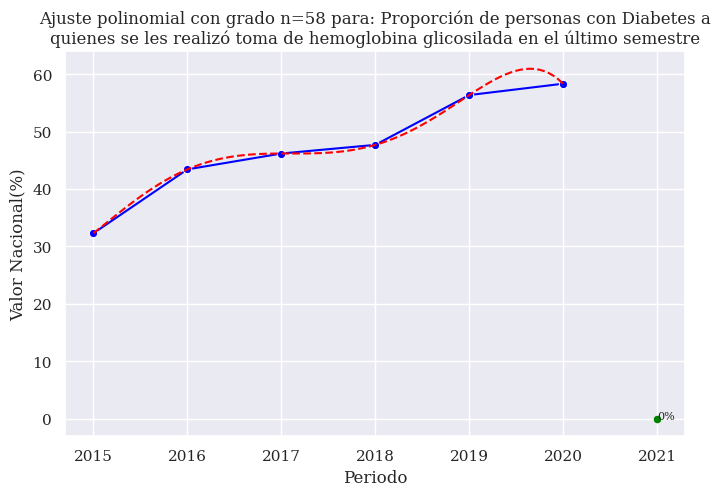

In [32]:
for i in range(0,59):
    periodo=x_test# x que se va a predecir
    coef=np.polyfit(x_train, y_train, i)# polino del grado i
    p=np.polyval(coef,periodo)# prediccion con el polinomio del grado i
    if p<0:# si la prediccion es negativa se pone en 0
        p=0     
    prediccion=pd.Series({'Periodo':periodo,'Valor':p})# se crea una serie con la prediccion
    x1=np.linspace(x_train.min(), x_train.max(), 100)# x para graficar el polinomio
    y1=np.polyval(coef,x1)# y para graficar el polinomio
    
    plt.figure(figsize=(8, 5))
    title='Ajuste polinomial con grado n='+str(i)+' para: '+str(indicador)
    plt.title('\n'.join(wrap(title,80)))

    sns.lineplot(x=x_train, y=y_train, marker='o', color='blue')
    sns.lineplot(x=x1, y=y1,linestyle="--",color='red')
    sns.scatterplot(x=[periodo],y=[p], color='green')
    font = {'family': 'serif',
            'weight': 'normal',
            'size': 8}
    plt.text(periodo, p, str(round(p,2))+"%", ha='left',fontdict=font)
    

### Error en la predicción con el valor real

Ahora relizamos un estudio que nos muestre que tan cerca esta las predicciónes con diferentes grados para el polinomio, para esto calculamos la diferencia absoluta entre el valor real y el valor predecido para cada uno de los grados del polinomio, de esta manera podemos determinar cual es el grado del polinomio en el que la predicción es más cercana al valor real.

/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(c

Text(30, 20, 'Error mínimo:3.562448786369167\nGrado del polinomio:0')

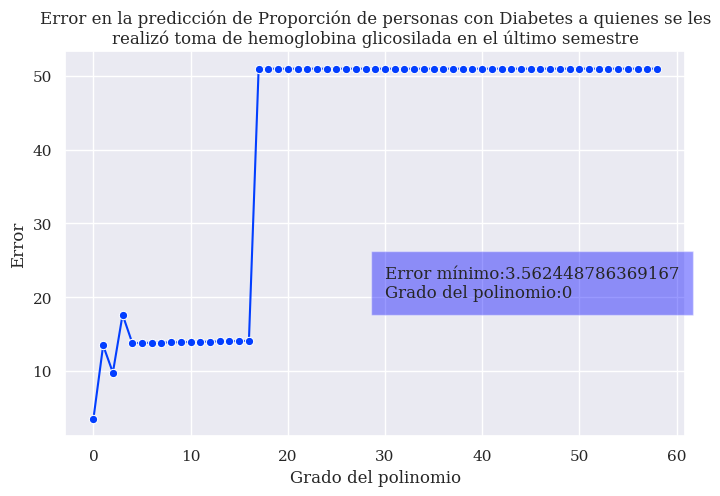

In [33]:
errors=pd.Series(dtype=float)

for i in range(0,59):
    periodo=x_test# x que se va a predecir
    coef=np.polyfit(x_train, y_train, i)# polino del grado i
    p=np.polyval(coef,periodo)# prediccion con el polinomio del grado i
    if p<0:# si la prediccion es negativa se pone en 0
        p=0
    errors.loc[i]=abs(p-y_test)# se guarda el error en la serie de errores

fig=plt.figure(figsize=(8, 5))
ax = fig.add_subplot(111)

plt.title('\n'.join(wrap('Error en la predicción de '+indicador,80)))
sns.lineplot(x=errors.index, y=errors, marker='o')
plt.xlabel('Grado del polinomio')
plt.ylabel('Error')

textstr='Error mínimo:' + str(min(errors))+ '\nGrado del polinomio:'+str(errors.idxmin())
ax.text(30, 20, textstr, bbox={'facecolor': 'blue', 'alpha': 0.4, 'pad': 10})



### Error total

Text(30, 20, 'Error mínimo:13.839343731576822\nGrado del polinomio:2')

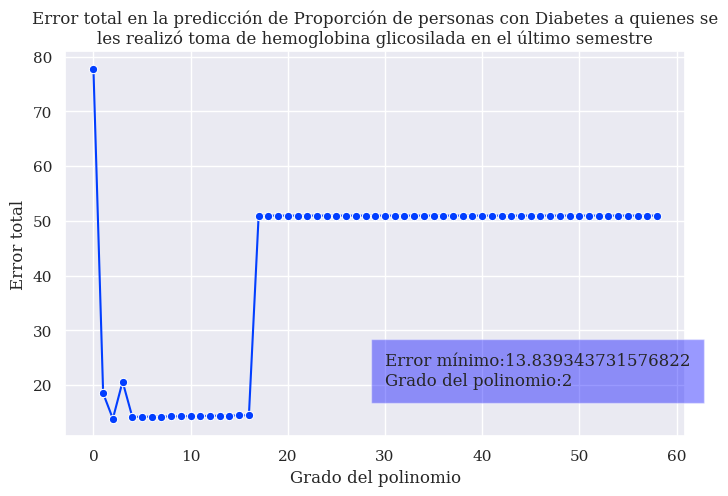

In [34]:
errorTotal=errorsMSE+errors

fig=plt.figure(figsize=(8, 5))
ax = fig.add_subplot(111)

plt.title('\n'.join(wrap('Error total en la predicción de '+indicador,80)))
sns.lineplot(x=errorTotal.index, y=errorTotal, marker='o')
plt.xlabel('Grado del polinomio')
plt.ylabel('Error total')

textstr='Error mínimo:' + str(min(errorTotal))+ '\nGrado del polinomio:'+str(errorTotal.idxmin())
ax.text(30, 20, textstr, bbox={'facecolor': 'blue', 'alpha': 0.4, 'pad': 10})

El grado del polinmoio con el menor error total es entonces:

In [35]:
grado=errorTotal.idxmin()
grado

2

### Predecir valores

/tmp/ipykernel_13837/3852952321.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  indicador_nacional=indicador_nacional.append(indicador_predecido, ignore_index=True)
/tmp/ipykernel_13837/3852952321.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  indicador_nacional=indicador_nacional.append(indicador_predecido, ignore_index=True)
/tmp/ipykernel_13837/3852952321.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  indicador_nacional=indicador_nacional.append(indicador_predecido, ignore_index=True)


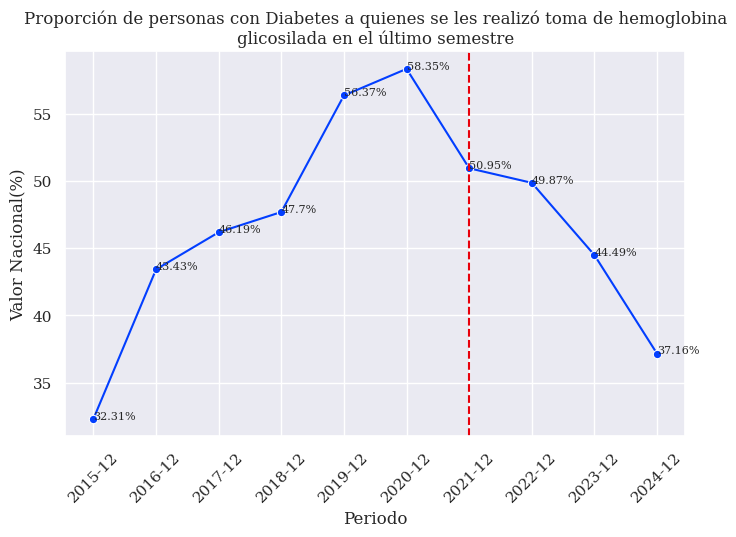

In [36]:
indicador_nacional=df_proporciones_ef[df_proporciones_ef["Indicador"]==indicador]
indicador_nacional=indicador_nacional[['Indicador','Factor','UnidadMedida','Periodo','Numerador','Denominador']].groupby(['Indicador','UnidadMedida','Factor','Periodo']).sum().reset_index()
indicador_nacional['Valor Nacional(%)']=(indicador_nacional['Numerador']/indicador_nacional['Denominador'])*indicador_nacional['Factor']

for i in range(0,3):
    periodo=2022+i
    coef=np.polyfit(x, y, grado)
    p=np.polyval(coef,periodo)
    indicador_predecido=pd.DataFrame({
        'Indicador':indicador,
        'UnidadMedida':'Porcentaje',
        'Factor':100,
        'Periodo':str(periodo)+'-12',
        'Numerador':np.nan,
        'Denominador':np.nan,
        'Valor Nacional(%)':p
    }, index=[0])
    indicador_nacional=indicador_nacional.append(indicador_predecido, ignore_index=True)

plt.figure(figsize=(8, 5))
plt.title('\n'.join(wrap(indicador,80)))
sns.lineplot(x='Periodo', y='Valor Nacional(%)',data=indicador_nacional,marker='o')
plt.axvline(x='2021-12', color='r', linestyle='--')
plt.xticks(rotation=45)
font = {'family': 'serif',
        'weight': 'normal',
        'size': 8}

for index, row in indicador_nacional.iterrows():
    plt.text(row['Periodo'], row['Valor Nacional(%)'], str(round(row['Valor Nacional(%)'],2))+"%", ha='left',fontdict=font)
plt.show()

## Predecir para todos los indicadores de proporción

Se crea un nuevi dataframe que almacenara el grado del polinomio que mejor se ajusta a los datos para cada uno de los indicadores, de esta manera podemos predecir el valor del indicador para el ultimo periodo

In [37]:
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)
grados=pd.DataFrame(columns=['Indicador','Grado','Error total'])
for indicador in indicador_proporciones:
    indicador_nacional=df_proporciones_ef[df_proporciones_ef["Indicador"]==indicador]
    indicador_nacional=indicador_nacional[['Indicador','Factor','UnidadMedida','Periodo','Numerador','Denominador']].groupby(['Indicador','UnidadMedida','Factor','Periodo']).sum().reset_index()
    indicador_nacional['Valor Nacional(%)']=(indicador_nacional['Numerador']/indicador_nacional['Denominador'])*indicador_nacional['Factor']
    x=indicador_nacional['Periodo']
    y=indicador_nacional['Valor Nacional(%)']
    x=pd.to_datetime(x, format='%Y-%m-%d',errors='coerce')
    x=x.dt.year
    if x.groupby(x).count().iloc[0]==2:
        for i in range(0,len(x),2):
            fecha=x.loc[i:i+1]
            x.loc[i]=fecha.loc[i]+0.5
    x_test=x.iloc[len(x)-1]
    y_test=y.iloc[len(y)-1]
    x_train=x.drop(len(x)-1)
    y_train=y.drop(len(x)-1)

    errorsMSE=pd.Series(dtype=float)
    errors=pd.Series(dtype=float)
    for i in range(0,59):
        periodo=x_test# x que se va a predecir
        coef=np.polyfit(x_train, y_train, i)# polino del grado i
        p=np.polyval(coef,periodo)# prediccion con el polinomio del grado i
        if p<0:# si la prediccion es negativa se pone en 0
            p=0
        if p>100:# si la prediccion es mayor a 100 se pone en 100
            p=99.99
        
        y_pred=pd.Series(dtype=float)# serie de prediccion
        for index, value in x_train.iteritems():# se recorre la serie de entrenamiento
            y_pred.loc[index]=np.polyval(coef,value)# se predice cada valor de la serie de entrenamiento
        MSE=(sum((y_train-y_pred)**2))/len(y_train)# error cuadratico medio
        errorsMSE.loc[i]=MSE# se guarda el error en la serie de errores
        errors.loc[i]=abs(p-y_test)# se guarda el error en la serie de errores

    errorTotal=errorsMSE+errors
    grados=grados.append({'Indicador':indicador,'Grado':errorTotal.idxmin(),'Error total':min(errorTotal)}, ignore_index=True)
grados

/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(c

,Indicador,Grado,Error total
0,Proporción de niños y niñas menores de 18 mese...,47,0.469484
1,Proporción de mujeres a las que se les realizó...,1,0.125853
2,Proporción de personas con Hipertensión Arteri...,46,1.527623
3,Proporción de personas con Diabetes a quienes ...,2,13.839344
4,Proporción de personas con Diabetes Mellitus a...,16,15.172923
5,Proporción de personas con Hipertensión Arteri...,16,7.743952
6,"Proporción de personas con Diabetes Mellitus, ...",16,20.645930
7,Proporción de gestantes con consulta de contro...,3,17.128870
8,Proporción de gestantes con valoración por odo...,21,77.473715
9,Proporción de recién nacidos con tamizaje par...,2,2.742651


/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/numpy/lib/polynomial.py:666: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/numpy/lib/polynomial.py:666: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.use

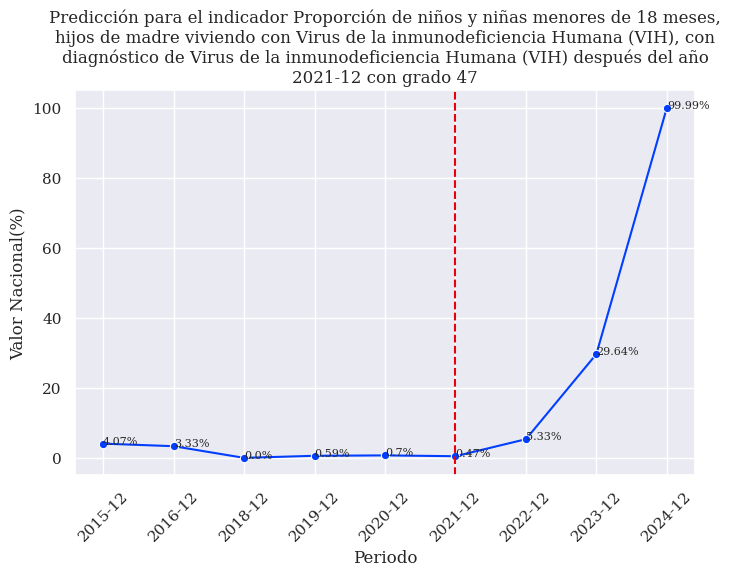

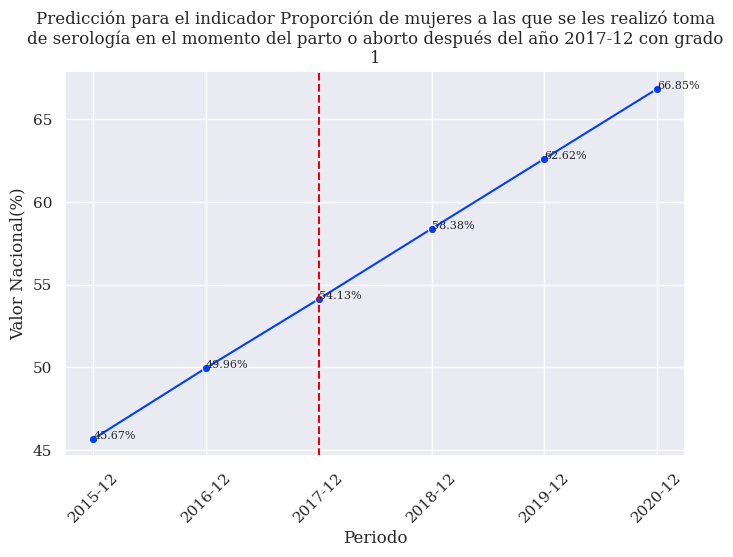

/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


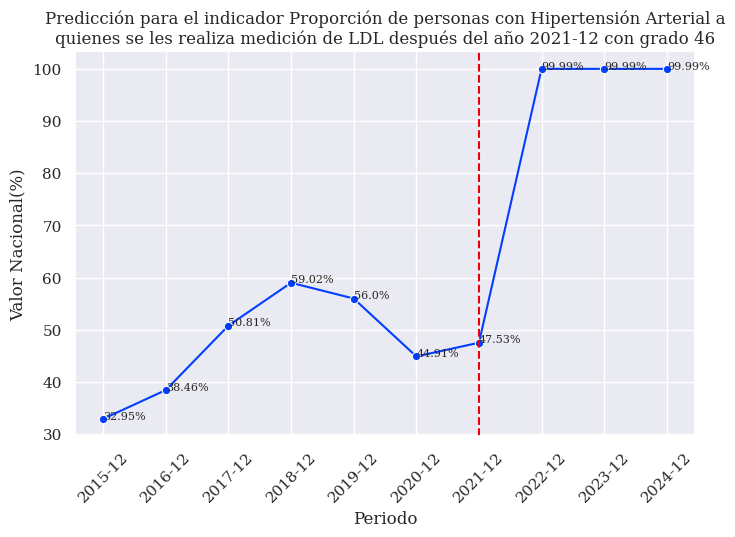

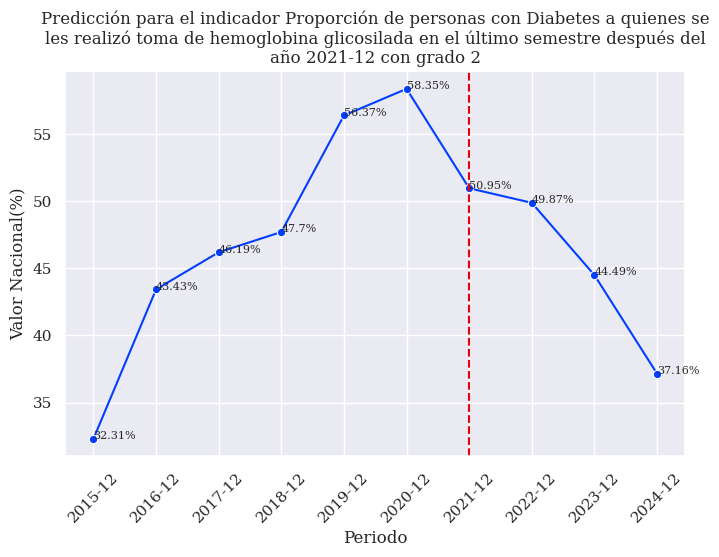

/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


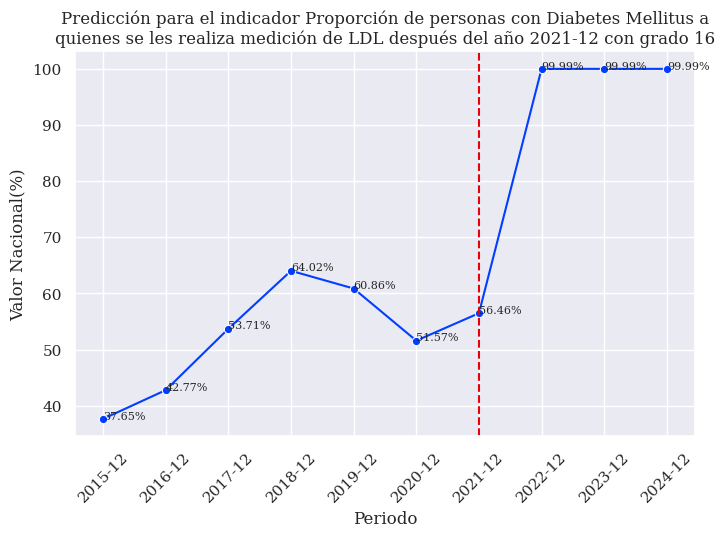

/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


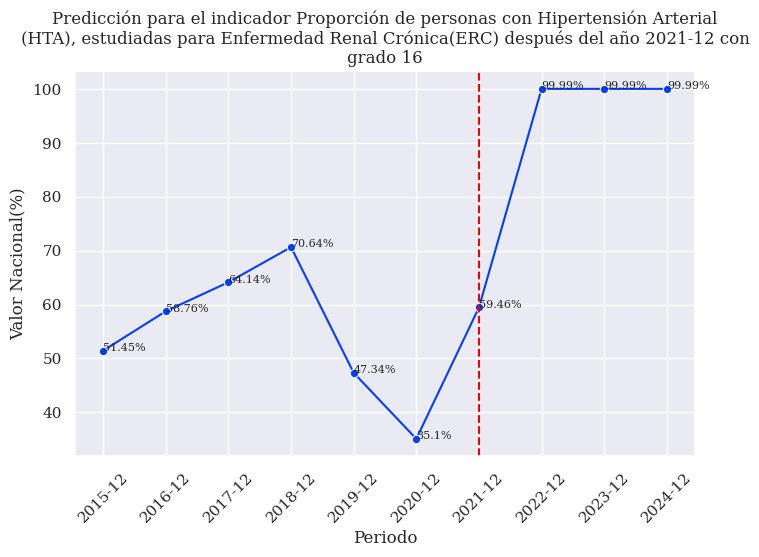

/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


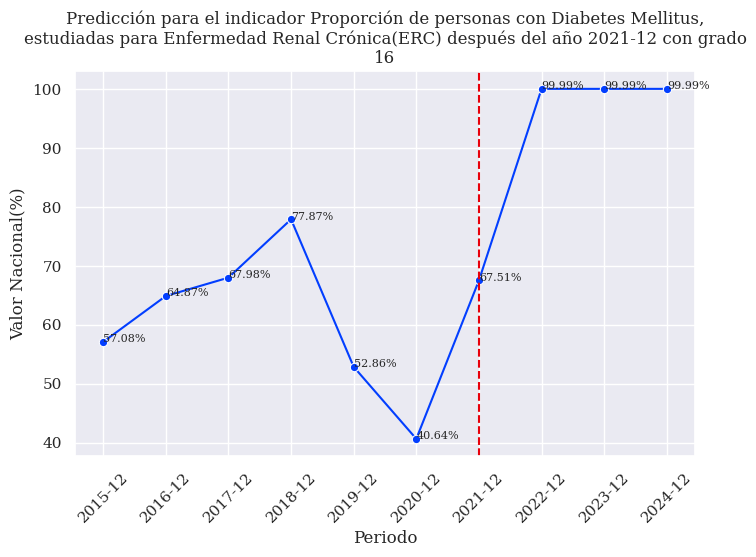

/tmp/ipykernel_13837/1032534025.py:14: SettingWithCopyWarning: modifications to a property of a datetimelike object are not supported and are discarded. Change values on the original.
  x.loc[i]=fecha.loc[i]+0.5


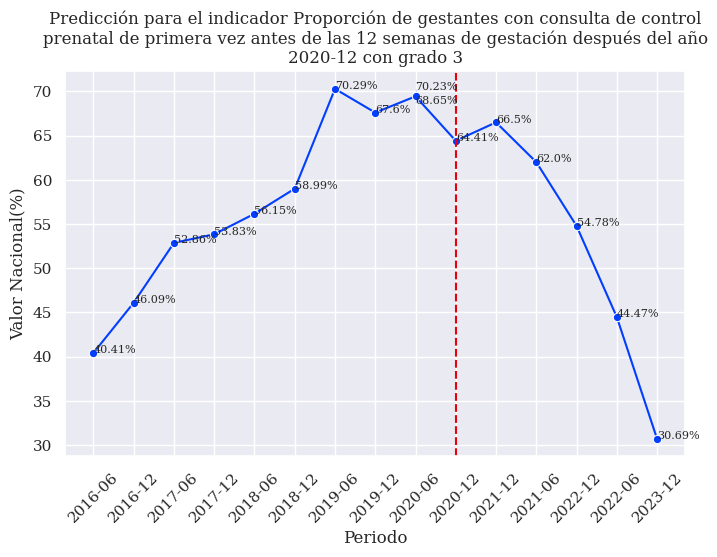

/tmp/ipykernel_13837/1032534025.py:14: SettingWithCopyWarning: modifications to a property of a datetimelike object are not supported and are discarded. Change values on the original.
  x.loc[i]=fecha.loc[i]+0.5
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home

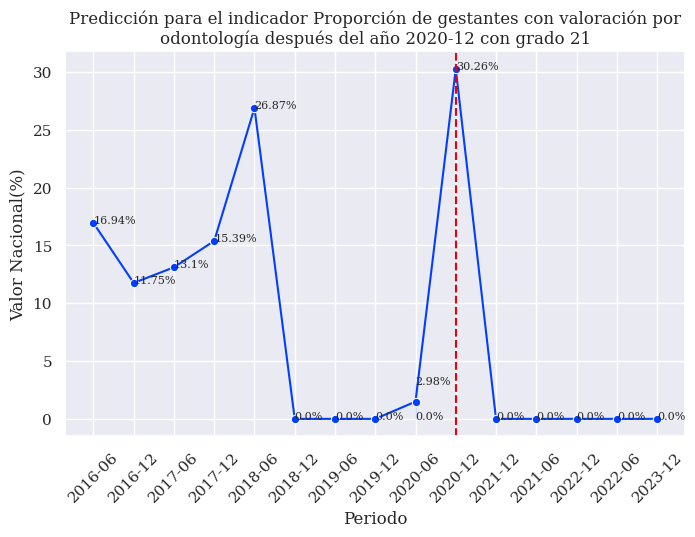

/tmp/ipykernel_13837/1032534025.py:14: SettingWithCopyWarning: modifications to a property of a datetimelike object are not supported and are discarded. Change values on the original.
  x.loc[i]=fecha.loc[i]+0.5


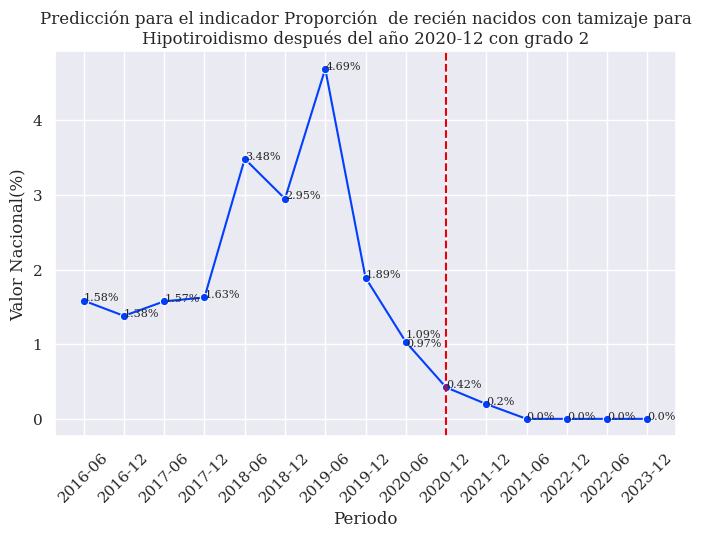

/tmp/ipykernel_13837/1032534025.py:14: SettingWithCopyWarning: modifications to a property of a datetimelike object are not supported and are discarded. Change values on the original.
  x.loc[i]=fecha.loc[i]+0.5


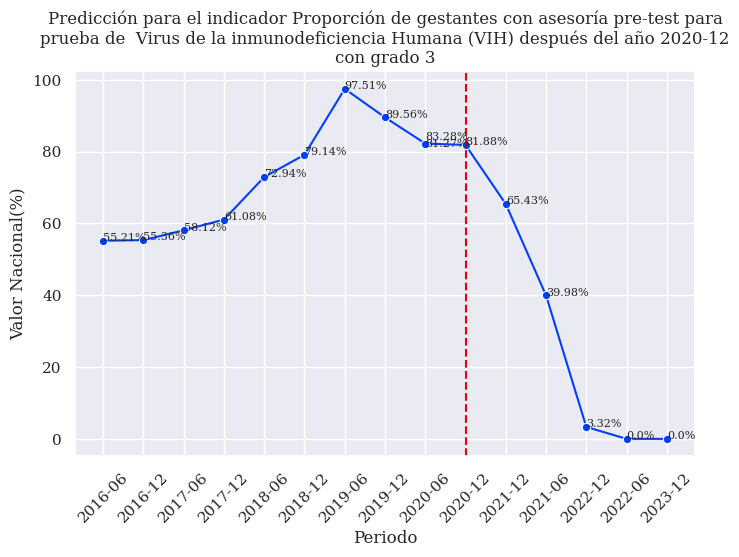

/tmp/ipykernel_13837/1032534025.py:14: SettingWithCopyWarning: modifications to a property of a datetimelike object are not supported and are discarded. Change values on the original.
  x.loc[i]=fecha.loc[i]+0.5


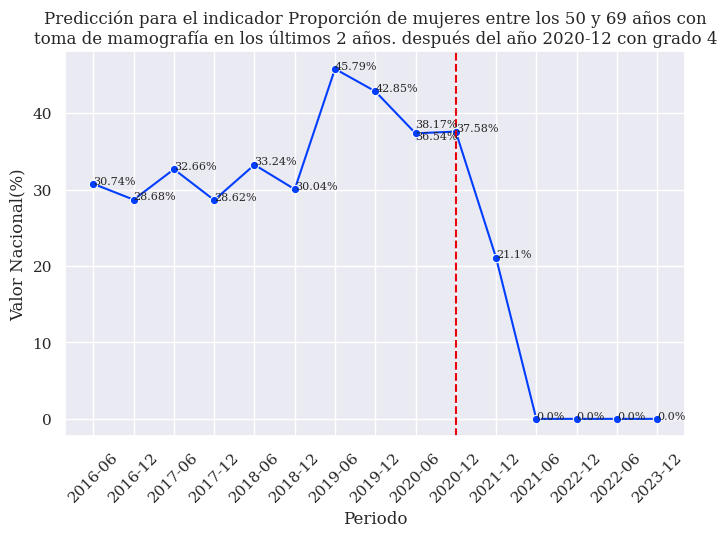

/tmp/ipykernel_13837/1032534025.py:14: SettingWithCopyWarning: modifications to a property of a datetimelike object are not supported and are discarded. Change values on the original.
  x.loc[i]=fecha.loc[i]+0.5


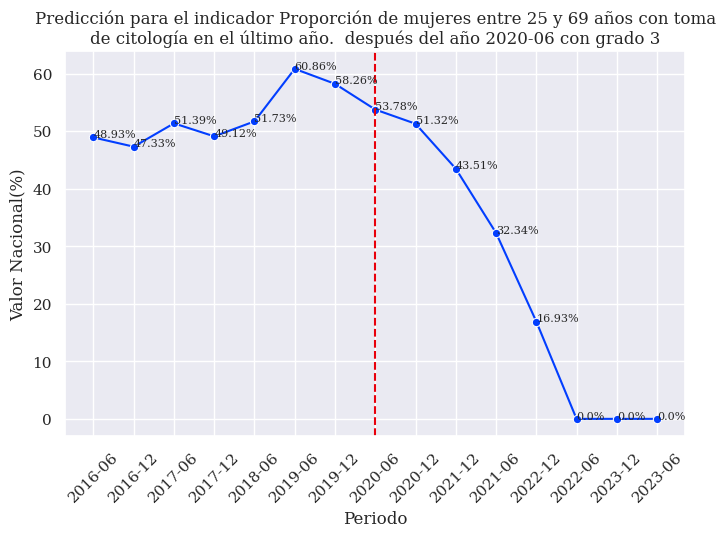

In [38]:
for indicador in indicador_proporciones:
    indicador_nacional=df_proporciones_ef[df_proporciones_ef["Indicador"]==indicador]
    indicador_nacional=indicador_nacional[['Indicador','Factor','UnidadMedida','Periodo','Numerador','Denominador']].groupby(['Indicador','UnidadMedida','Factor','Periodo']).sum().reset_index()
    indicador_nacional['Valor Nacional(%)']=(indicador_nacional['Numerador']/indicador_nacional['Denominador'])*indicador_nacional['Factor']
    x=indicador_nacional['Periodo']
    y=indicador_nacional['Valor Nacional(%)']

    x=pd.to_datetime(x, format='%Y-%m-%d',errors='coerce')
    x=x.dt.year
    step=1
    if x.groupby(x).count().iloc[0]==2:
        for i in range(0,len(x),2):
            fecha=x.loc[i:i+1]
            x.loc[i]=fecha.loc[i]+0.5
        step=0.5
    años=3    
    periodo=x.iloc[len(x)-1]
    i=0
    grado=grados[grados['Indicador']==indicador]['Grado'].iloc[0]
    
    valores_predecidos=pd.DataFrame(columns=['Indicador','UnidadMedida','Factor','Periodo','Numerador','Denominador','Valor Nacional(%)'])
    while i<años:
        i+=step
        periodo=periodo+step
        coef=np.polyfit(x, y, grado)
        p=np.polyval(coef,periodo)
        if p<0:# si la prediccion es negativa se pone en 0
            p=0
        if p>100:# si la prediccion es mayor a 100 se pone en 100
            p=99.99
        periodostr=''
        if periodo-int(periodo)==0:
            periodostr=str(int(periodo))+'-12'
        else:
            periodostr=str(int(periodo))+'-06'
        indicador_predecido=pd.DataFrame({
            'Indicador':indicador,
            'UnidadMedida':'Porcentaje',
            'Factor':100,
            'Periodo':periodostr,
            'Numerador':np.nan,
            'Denominador':np.nan,
            'Valor Nacional(%)':p
        }, index=[0])
        valores_predecidos=valores_predecidos.append(indicador_predecido, ignore_index=True)
    
    indicador_nacional=indicador_nacional.append(valores_predecidos, ignore_index=True)
    periodo=x.iloc[len(x)-1]
    if periodo-int(periodo)==0:
        periodo=str(int(periodo))+'-12'
    else:
        periodo=str(int(periodo))+'-06'
    plt.figure(figsize=(8, 5))
    title='Predicción para el indicador '+str(indicador)+' después del año '+str(periodo)+' con grado '+str(grado)
    plt.title('\n'.join(wrap(title,80)))
    sns.lineplot(x='Periodo', y='Valor Nacional(%)',data=indicador_nacional,marker='o')
    plt.axvline(x=str(periodo), color='r', linestyle='--')
    plt.xticks(rotation=45)
    font = {'family': 'serif',
            'weight': 'normal',
            'size': 8}

    for index, row in indicador_nacional.iterrows():
        plt.text(row['Periodo'], row['Valor Nacional(%)'], str(round(row['Valor Nacional(%)'],2))+"%", ha='left',fontdict=font)
    plt.show()

## Predecir para todos los indicadores de promedio

In [39]:
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)
grados=pd.DataFrame(columns=['Indicador','Grado','Error total'])
for indicador in indicadores_promedios:
    indicador_nacional=df_promedios_ef[df_promedios_ef["Indicador"]==indicador]
    indicador_nacional=indicador_nacional[['Indicador','Factor','UnidadMedida','Periodo','Numerador','Denominador']].groupby(['Indicador','UnidadMedida','Factor','Periodo']).sum().reset_index()
    indicador_nacional['Valor Nacional(días)']=(indicador_nacional['Numerador']/indicador_nacional['Denominador'])*indicador_nacional['Factor']
    x=indicador_nacional['Periodo']
    y=indicador_nacional['Valor Nacional(días)']
    x=pd.to_datetime(x, format='%Y-%m-%d',errors='coerce')
    x=x.dt.year
    if x.groupby(x).count().iloc[0]==2:
        for i in range(0,len(x),2):
            fecha=x.loc[i:i+1]
            x.loc[i]=fecha.loc[i]+0.5
    x_test=x.iloc[len(x)-1]
    y_test=y.iloc[len(y)-1]
    x_train=x.drop(len(x)-1)
    y_train=y.drop(len(x)-1)

    errorsMSE=pd.Series(dtype=float)
    errors=pd.Series(dtype=float)
    for i in range(0,59):
        periodo=x_test# x que se va a predecir
        coef=np.polyfit(x_train, y_train, i)# polino del grado i
        p=np.polyval(coef,periodo)# prediccion con el polinomio del grado i
        if p<0:# si la prediccion es negativa se pone en 0
            p=0
        if p>100:# si la prediccion es mayor a 100 se pone en 100
            p=99.99
        
        y_pred=pd.Series(dtype=float)# serie de prediccion
        for index, value in x_train.iteritems():# se recorre la serie de entrenamiento
            y_pred.loc[index]=np.polyval(coef,value)# se predice cada valor de la serie de entrenamiento
        MSE=(sum((y_train-y_pred)**2))/len(y_train)# error cuadratico medio
        errorsMSE.loc[i]=MSE# se guarda el error en la serie de errores
        errors.loc[i]=abs(p-y_test)# se guarda el error en la serie de errores

    errorTotal=errorsMSE+errors
    grados=grados.append({'Indicador':indicador,'Grado':errorTotal.idxmin(),'Error total':min(errorTotal)}, ignore_index=True)
grados

/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(c

,Indicador,Grado,Error total
0,Tiempo promedio de espera para el inicio del t...,2,13.107348
1,Tiempo promedio de espera entre el diagnóstico...,3,7.311480


lorem ipsum

```python

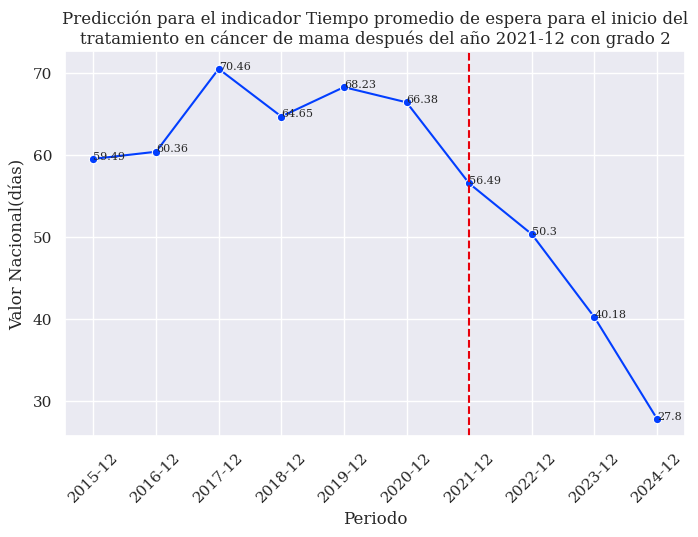

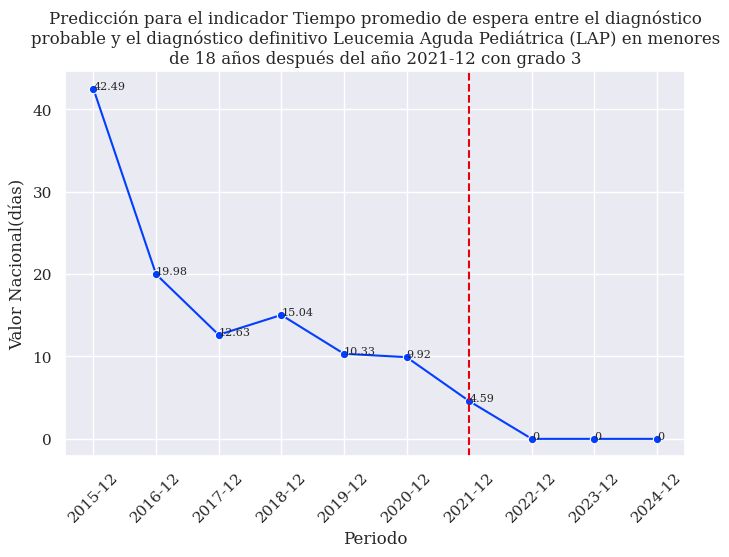

In [40]:
for indicador in indicadores_promedios:
    indicador_nacional=df_promedios_ef[df_promedios_ef["Indicador"]==indicador]
    indicador_nacional=indicador_nacional[['Indicador','Factor','UnidadMedida','Periodo','Numerador','Denominador']].groupby(['Indicador','UnidadMedida','Factor','Periodo']).sum().reset_index()
    indicador_nacional['Valor Nacional(días)']=(indicador_nacional['Numerador']/indicador_nacional['Denominador'])*indicador_nacional['Factor']
    x=indicador_nacional['Periodo']
    y=indicador_nacional['Valor Nacional(días)']

    x=pd.to_datetime(x, format='%Y-%m-%d',errors='coerce')
    x=x.dt.year
    step=1
    if x.groupby(x).count().iloc[0]==2:
        for i in range(0,len(x),2):
            fecha=x.loc[i:i+1]
            x.loc[i]=fecha.loc[i]+0.5
        step=0.5
    años=3    
    periodo=x.iloc[len(x)-1]
    i=0
    grado=grados[grados['Indicador']==indicador]['Grado'].iloc[0]
    
    valores_predecidos=pd.DataFrame(columns=['Indicador','UnidadMedida','Factor','Periodo','Numerador','Denominador','Valor Nacional(días)'])
    while i<años:
        i+=step
        periodo=periodo+step
        coef=np.polyfit(x, y, grado)
        p=np.polyval(coef,periodo)
        if p<0:# si la prediccion es negativa se pone en 0
            p=0
        periodostr=''
        if periodo-int(periodo)==0:
            periodostr=str(int(periodo))+'-12'
        else:
            periodostr=str(int(periodo))+'-06'
        indicador_predecido=pd.DataFrame({
            'Indicador':indicador,
            'UnidadMedida':'Porcentaje',
            'Factor':100,
            'Periodo':periodostr,
            'Numerador':np.nan,
            'Denominador':np.nan,
            'Valor Nacional(días)':p
        }, index=[0])
        valores_predecidos=valores_predecidos.append(indicador_predecido, ignore_index=True)
    
    indicador_nacional=indicador_nacional.append(valores_predecidos, ignore_index=True)
    periodo=x.iloc[len(x)-1]
    if periodo-int(periodo)==0:
        periodo=str(int(periodo))+'-12'
    else:
        periodo=str(int(periodo))+'-06'
    plt.figure(figsize=(8, 5))
    title='Predicción para el indicador '+str(indicador)+' después del año '+str(periodo)+' con grado '+str(grado)
    plt.title('\n'.join(wrap(title,80)))
    sns.lineplot(x='Periodo', y='Valor Nacional(días)',data=indicador_nacional,marker='o')
    plt.axvline(x=str(periodo), color='r', linestyle='--')
    plt.xticks(rotation=45)
    font = {'family': 'serif',
            'weight': 'normal',
            'size': 8}

    for index, row in indicador_nacional.iterrows():
        plt.text(row['Periodo'], row['Valor Nacional(días)'], str(round(row['Valor Nacional(días)'],2)), ha='left',fontdict=font)
    plt.show()

## Predecir para las tasas

In [41]:
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)
grados=pd.DataFrame(columns=['Indicador','Grado','Error total'])
for indicador in indicadores_tasas:
    indicador_nacional=df_tasas_ef[df_tasas_ef["Indicador"]==indicador]
    indicador_nacional=indicador_nacional[['Indicador','Factor','UnidadMedida','Periodo','Numerador','Denominador']].groupby(['Indicador','UnidadMedida','Factor','Periodo']).sum().reset_index()
    indicador_nacional['Valor Nacional()']=(indicador_nacional['Numerador']/indicador_nacional['Denominador'])*indicador_nacional['Factor']
    x=indicador_nacional['Periodo']
    y=indicador_nacional['Valor Nacional()']
    x=pd.to_datetime(x, format='%Y-%m-%d',errors='coerce')
    x=x.dt.year
    if x.groupby(x).count().iloc[0]==2:
        for i in range(0,len(x),2):
            fecha=x.loc[i:i+1]
            x.loc[i]=fecha.loc[i]+0.5
    x_test=x.iloc[len(x)-1]
    y_test=y.iloc[len(y)-1]
    x_train=x.drop(len(x)-1)
    y_train=y.drop(len(x)-1)

    errorsMSE=pd.Series(dtype=float)
    errors=pd.Series(dtype=float)
    for i in range(0,59):
        periodo=x_test# x que se va a predecir
        coef=np.polyfit(x_train, y_train, i)# polino del grado i
        p=np.polyval(coef,periodo)# prediccion con el polinomio del grado i
        if p<0:# si la prediccion es negativa se pone en 0
            p=0
        y_pred=pd.Series(dtype=float)# serie de prediccion
        for index, value in x_train.iteritems():# se recorre la serie de entrenamiento
            y_pred.loc[index]=np.polyval(coef,value)# se predice cada valor de la serie de entrenamiento
        MSE=(sum((y_train-y_pred)**2))/len(y_train)# error cuadratico medio
        errorsMSE.loc[i]=MSE# se guarda el error en la serie de errores
        errors.loc[i]=abs(p-y_test)# se guarda el error en la serie de errores

    errorTotal=errorsMSE+errors
    grados=grados.append({'Indicador':indicador,'Grado':errorTotal.idxmin(),'Error total':min(errorTotal)}, ignore_index=True)
grados

/tmp/ipykernel_13837/3419751995.py:16: SettingWithCopyWarning: modifications to a property of a datetimelike object are not supported and are discarded. Change values on the original.
  x.loc[i]=fecha.loc[i]+0.5
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home

,Indicador,Grado,Error total
0,Tasa de mortalidad perinatal,51,0.329898


/tmp/ipykernel_13837/3955567740.py:14: SettingWithCopyWarning: modifications to a property of a datetimelike object are not supported and are discarded. Change values on the original.
  x.loc[i]=fecha.loc[i]+0.5
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/numpy/lib/polynomial.py:666: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3460: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/jhonsvzb/Documentos/Proyectos/Salud en Colombia/case.quality_of_health_in_Colombia/venv/lib/python3.10/site-packages/numpy/lib/polynomial.py:666: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
/home/jhonsvzb/Documentos/Proyectos/Salud e

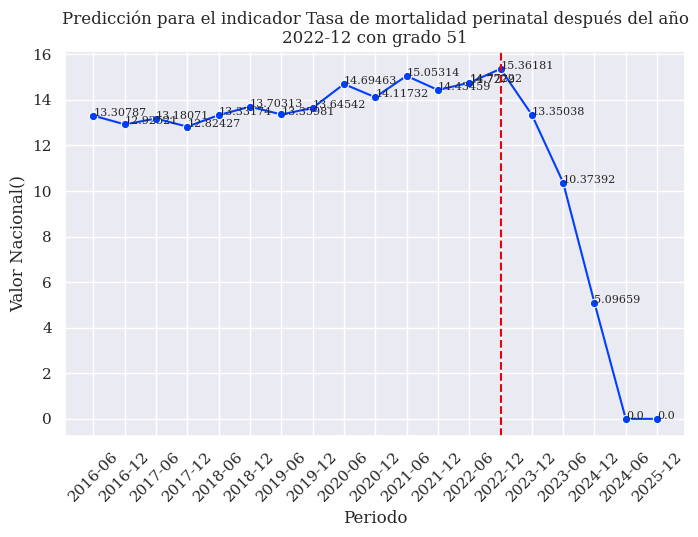

In [42]:
for indicador in indicadores_tasas:
    indicador_nacional=df_tasas_ef[df_tasas_ef["Indicador"]==indicador]
    indicador_nacional=indicador_nacional[['Indicador','Factor','UnidadMedida','Periodo','Numerador','Denominador']].groupby(['Indicador','UnidadMedida','Factor','Periodo']).sum().reset_index()
    indicador_nacional['Valor Nacional()']=(indicador_nacional['Numerador']/indicador_nacional['Denominador'])*indicador_nacional['Factor']
    x=indicador_nacional['Periodo']
    y=indicador_nacional['Valor Nacional()']

    x=pd.to_datetime(x, format='%Y-%m-%d',errors='coerce')
    x=x.dt.year
    step=1
    if x.groupby(x).count().iloc[0]==2:
        for i in range(0,len(x),2):
            fecha=x.loc[i:i+1]
            x.loc[i]=fecha.loc[i]+0.5
        step=0.5
    años=3    
    periodo=x.iloc[len(x)-1]
    i=0
    grado=grados[grados['Indicador']==indicador]['Grado'].iloc[0]
    
    valores_predecidos=pd.DataFrame(columns=['Indicador','UnidadMedida','Factor','Periodo','Numerador','Denominador','Valor Nacional()'])
    while i<años:
        i+=step
        periodo=periodo+step
        coef=np.polyfit(x, y, grado)
        p=np.polyval(coef,periodo)
        if p<0:# si la prediccion es negativa se pone en 0
            p=0
        periodostr=''
        if periodo-int(periodo)==0:
            periodostr=str(int(periodo))+'-12'
        else:
            periodostr=str(int(periodo))+'-06'
        indicador_predecido=pd.DataFrame({
            'Indicador':indicador,
            'UnidadMedida':'Porcentaje',
            'Factor':100,
            'Periodo':periodostr,
            'Numerador':np.nan,
            'Denominador':np.nan,
            'Valor Nacional()':p
        }, index=[0])
        valores_predecidos=valores_predecidos.append(indicador_predecido, ignore_index=True)
    
    indicador_nacional=indicador_nacional.append(valores_predecidos, ignore_index=True)
    periodo=x.iloc[len(x)-1]
    if periodo-int(periodo)==0:
        periodo=str(int(periodo))+'-12'
    else:
        periodo=str(int(periodo))+'-06'
    plt.figure(figsize=(8, 5))
    title='Predicción para el indicador '+str(indicador)+' después del año '+str(periodo)+' con grado '+str(grado)
    plt.title('\n'.join(wrap(title,80)))
    sns.lineplot(x='Periodo', y='Valor Nacional()',data=indicador_nacional,marker='o')
    plt.axvline(x=str(periodo), color='r', linestyle='--')
    plt.xticks(rotation=45)
    font = {'family': 'serif',
            'weight': 'normal',
            'size': 8}

    for index, row in indicador_nacional.iterrows():
        plt.text(row['Periodo'], row['Valor Nacional()'], str(round(row['Valor Nacional()'],5)), ha='left',fontdict=font)
    plt.show()

---